## Import Libraries

In [1]:
import pandas as pd
import numpy as np

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.feature_selection import SequentialFeatureSelector
from scipy import stats
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

### 1) Prepare data for Analysis,  Treat Missing Data, Wrong Data, Outlier Data

### Read the data

In [2]:
df = pd.read_excel("Attrition Case Study.xlsx")
df.head()

,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,0,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,1,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,0,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,0,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [3]:
df.shape

(1470, 35)

In [4]:
df.columns

Index(['Attrition', 'Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Attrition                 1470 non-null   int64 
 1   Age                       1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [6]:
df.isna().sum()

Attrition                   0
Age                         0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [7]:
new_df= df.drop(["Attrition"],axis=1)
new_df.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [8]:
new_df.shape

(1470, 34)

In [9]:
cat = []
con = []
for i in new_df.columns:
    if(df[i].dtypes == "object"):
        cat.append(i)
    else:
        con.append(i)

In [10]:
cat,con

(['BusinessTravel',
  'Department',
  'EducationField',
  'Gender',
  'JobRole',
  'MaritalStatus',
  'Over18',
  'OverTime'],
 ['Age',
  'DailyRate',
  'DistanceFromHome',
  'Education',
  'EmployeeCount',
  'EmployeeNumber',
  'EnvironmentSatisfaction',
  'HourlyRate',
  'JobInvolvement',
  'JobLevel',
  'JobSatisfaction',
  'MonthlyIncome',
  'MonthlyRate',
  'NumCompaniesWorked',
  'PercentSalaryHike',
  'PerformanceRating',
  'RelationshipSatisfaction',
  'StandardHours',
  'StockOptionLevel',
  'TotalWorkingYears',
  'TrainingTimesLastYear',
  'WorkLifeBalance',
  'YearsAtCompany',
  'YearsInCurrentRole',
  'YearsSinceLastPromotion',
  'YearsWithCurrManager'])

In [11]:
df_cat = new_df[cat]
df_cat

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...
1465,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [12]:
df_con = new_df[con]
df_con

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,4,5993,19479,8,11,3,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,2,5130,24907,1,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,3,2090,2396,6,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,3,2909,23159,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,2,3468,16632,9,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,4,2571,12290,4,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,613,6,1,1,2062,4,42,2,3,1,9991,21457,4,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,155,4,3,1,2064,2,87,4,2,2,6142,5174,1,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,1023,2,3,1,2065,4,63,2,2,2,5390,13243,2,14,3,4,80,0,17,3,2,9,6,0,8


### Outliers

In [13]:
#we check and handle outliers in continuous features only

<AxesSubplot:>

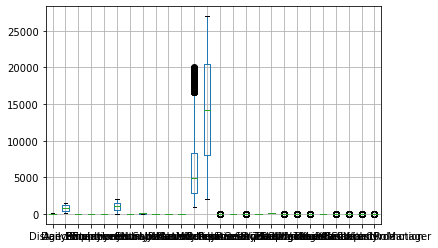

In [14]:
df_con.boxplot()

In [15]:
df_con.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [16]:
outlier = ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager']

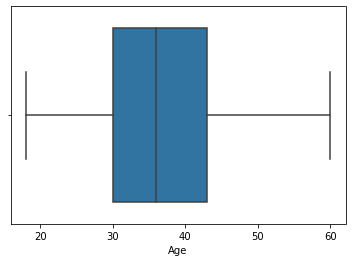

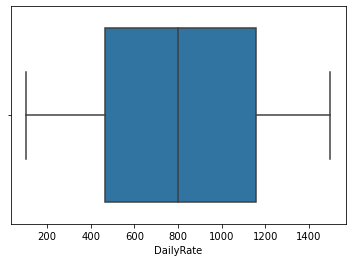

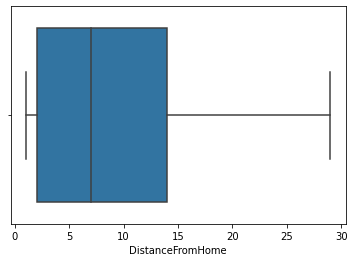

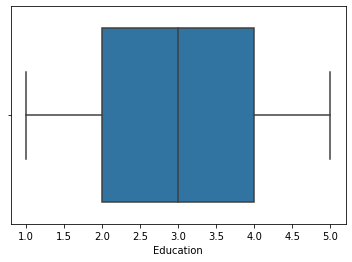

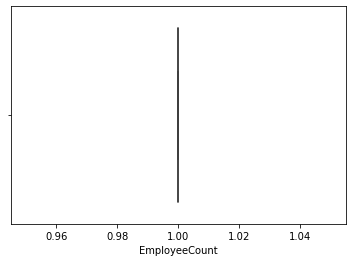

...

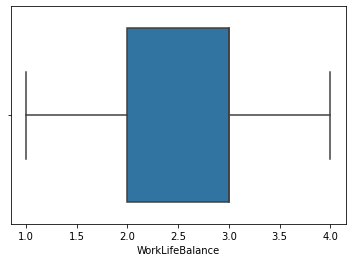

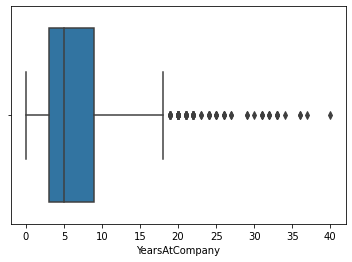

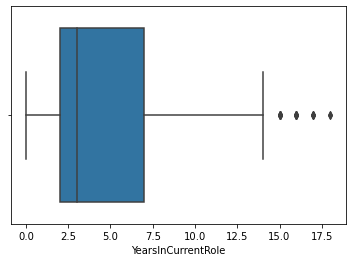

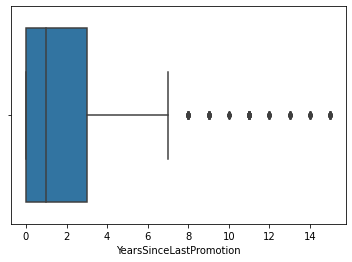

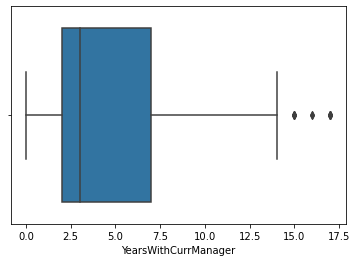

In [17]:
for i in outlier:
    sns.boxplot(df_con[i])
    plt.show()

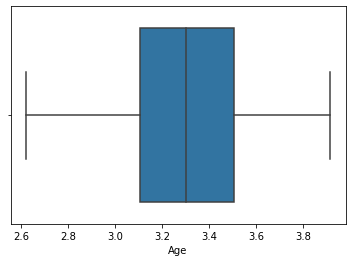

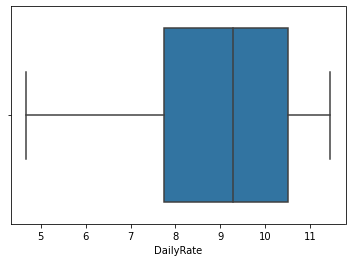

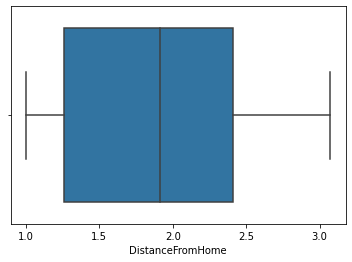

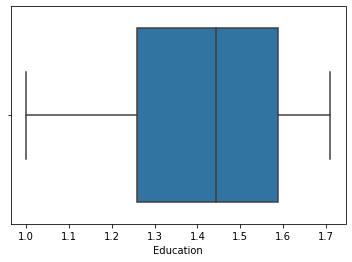

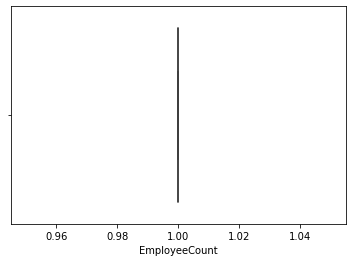

...

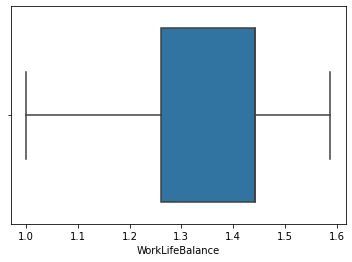

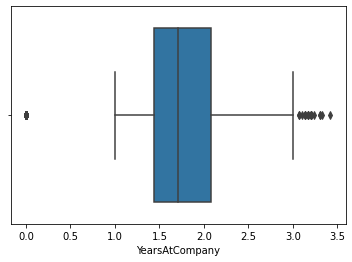

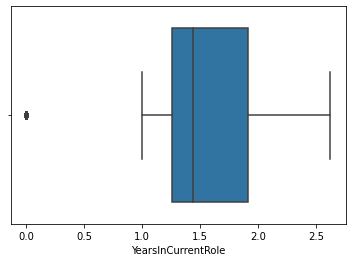

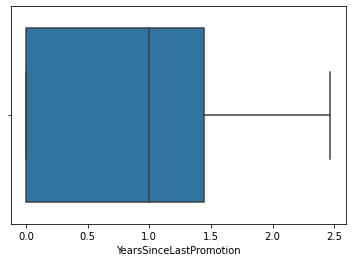

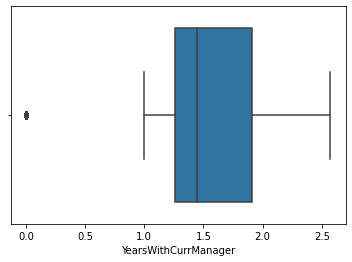

In [18]:
for i in outlier:
    sns.boxplot(np.cbrt(df_con[i]))
    plt.show()

### 2) Create new/derived predictors (e.g. Age group) for analysis

In [19]:
df_con

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,2,1,1,2,94,3,2,4,5993,19479,8,11,3,1,80,0,8,0,1,6,4,0,5
1,49,279,8,1,1,2,3,61,2,2,2,5130,24907,1,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1373,2,2,1,4,4,92,2,1,3,2090,2396,6,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1392,3,4,1,5,4,56,3,1,3,2909,23159,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,591,2,1,1,7,1,40,3,1,2,3468,16632,9,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,4,2571,12290,4,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,613,6,1,1,2062,4,42,2,3,1,9991,21457,4,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,155,4,3,1,2064,2,87,4,2,2,6142,5174,1,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,1023,2,3,1,2065,4,63,2,2,2,5390,13243,2,14,3,4,80,0,17,3,2,9,6,0,8


In [20]:
df_con['Age'].unique

<bound method Series.unique of 0       41
1       49
2       37
3       33
4       27
        ..
1465    36
1466    39
1467    27
1468    49
1469    34
Name: Age, Length: 1470, dtype: int64>

In [21]:
df_con['Age'].value_counts()

35    78
34    77
36    69
31    69
29    68
32    61
30    60
38    58
33    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
24    26
25    26
47    24
49    24
55    22
53    19
48    19
51    19
52    18
54    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64

In [22]:
Q = []
for i in df_con.Age:
    if(i<=18):
        Q.append("Child")
    elif(i>18 and i<=40):
        Q.append("Adult")
    else:
        Q.append("Old")

In [23]:
df_cat['Age Group']=Q

In [24]:
df_cat

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,Age Group
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes,Old
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No,Old
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes,Adult
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes,Adult
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,Adult
...,...,...,...,...,...,...,...,...,...
1465,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,Adult
1466,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No,Adult
1467,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes,Adult
1468,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No,Old


### OHE of categorical columns

In [25]:
df_cat = pd.get_dummies(df_cat)
df_cat

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1


### Standardization of con columns

In [26]:
ss = StandardScaler()
X1 = ss.fit_transform(df_con)
X1

array([[ 0.4463504 ,  0.74252653, -1.01090934, ..., -0.0632959 ,
        -0.67914568,  0.24583399],
       [ 1.32236521, -1.2977746 , -0.14714972, ...,  0.76499762,
        -0.36871529,  0.80654148],
       [ 0.008343  ,  1.41436324, -0.88751511, ..., -1.16768726,
        -0.67914568, -1.15593471],
       ...,
       [-1.08667552, -1.60518328, -0.64072665, ..., -0.61549158,
        -0.67914568, -0.31487349],
       [ 1.32236521,  0.54667746, -0.88751511, ...,  0.48889978,
        -0.67914568,  1.08689522],
       [-0.32016256, -0.43256792, -0.14714972, ..., -0.33939374,
        -0.36871529, -0.59522723]])

In [27]:
df1 = pd.DataFrame(X1,columns=df_con.columns)
df1

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1466,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541
1467,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873
1468,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.660853,-0.236474,-0.150393,-0.277594,-0.330589,-0.426230,1.191438,0.0,-0.932014,0.735447,0.155707,-1.077862,0.325228,0.488900,-0.679146,1.086895


In [28]:
df_y = df[['Attrition']]

In [29]:
final_df = pd.concat([df_cat,df1,df_y],axis=1)
final_df

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,1
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,0
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,1
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,0
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873,0
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541,0
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873,0
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.1422

### 3) Explore the Data using Exploratory Data Analysis - For Y and all Xs

In [30]:
final_df.skew()

BusinessTravel_Non-Travel             2.632066
BusinessTravel_Travel_Frequently      1.595067
BusinessTravel_Travel_Rarely         -0.923992
Department_Human Resources            4.518824
Department_Research & Development    -0.646936
Department_Sales                      0.856158
EducationField_Human Resources        7.181112
EducationField_Life Sciences          0.356919
EducationField_Marketing              2.525783
EducationField_Medical                0.794118
EducationField_Other                  3.875119
EducationField_Technical Degree       2.872604
Gender_Female                         0.408665
Gender_Male                          -0.408665
JobRole_Healthcare Representative     2.887251
JobRole_Human Resources               5.035637
JobRole_Laboratory Technician         1.701604
JobRole_Manager                       3.392611
JobRole_Manufacturing Director        2.694844
JobRole_Research Director             3.932443
JobRole_Research Scientist            1.512214
JobRole_Sales

In [31]:
final_df.corr()

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
BusinessTravel_Non-Travel,1.000000,-0.162435,-0.526850,-0.004755,-0.005013,0.007283,0.020835,0.005311,-0.030567,0.012828,-0.013389,0.004171,-0.050461,0.050461,0.012878,-0.015890,0.009270,0.014078,-0.013536,-0.021431,-0.010116,0.031022,-0.033780,0.057455,-0.043635,-0.004622,NaN,0.037163,-0.037163,-0.008345,0.097251,-0.007002,-0.011215,0.012096,0.023605,0.004524,NaN,0.022272,0.003568,-0.016994,-0.045779,-0.007295,0.019802,-0.017261,0.015279,0.002718,0.036591,0.018310,0.021132,NaN,0.028807,-0.029742,-0.020746,0.005780,0.007623,0.011549,0.020815,0.016716,-0.074457
BusinessTravel_Travel_Frequently,-0.162435,1.000000,-0.753092,-0.007485,0.003340,-0.000160,0.011818,0.031128,-0.016586,-0.005367,-0.011004,-0.023569,0.022015,-0.022015,0.008029,0.001896,0.010023,-0.042583,0.009783,-0.023579,-0.004461,-0.010175,0.055469,0.005779,-0.030785,0.027734,NaN,-0.029392,0.029392,0.022826,0.011646,-0.024772,-0.024743,-0.011776,0.005081,-0.008292,NaN,-0.007980,-0.012624,-0.018819,0.004424,-0.021557,0.027117,-0.031658,0.000344,-0.039718,-0.006675,0.016463,0.028500,NaN,-0.016142,-0.012177,0.006193,0.010199,0.012991,0.001680,0.023216,0.012628,0.115143
BusinessTravel_Travel_Rarely,-0.526850,-0.753092,1.000000,0.009618,0.000465,-0.004718,-0.024073,-0.030355,0.034668,-0.003930,0.018406,0.017521,0.014682,-0.014682,-0.015503,0.008962,-0.014815,0.027294,0.000598,0.034600,0.010588,-0.011920,-0.025257,-0.043287,0.055613,-0.020808,NaN,0.000539,-0.000539,-0.014098,-0.074876,0.026008,0.028791,0.002078,-0.020116,0.004126,NaN,-0.007976,0.008496,0.027541,0.026714,0.023433,-0.036562,0.038779,-0.010484,0.032401,-0.018649,-0.026390,-0.038640,NaN,-0.005303,0.030320,0.008498,-0.012640,-0.016274,-0.009147,-0.033877,-0.022023,-0.049538
Department_Human Resources,-0.004755,-0.007485,0.009618,1.000000,-0.290754,-0.139650,0.646436,-0.068040,-0.073692,-0.049761,-0.007527,-0.019469,-0.035652,0.035652,-0.066186,0.904983,-0.097859,0.087615,-0.070000,-0.050765,-0.105352,-0.112959,-0.051764,0.016037,0.034767,-0.051443,NaN,0.006178,-0.006178,-0.026808,-0.015653,0.029406,0.020523,-0.026726,-0.012901,0.011435,NaN,0.063431,-0.007597,-0.016551,0.004789,-0.006157,-0.024068,0.006815,-0.024390,0.020618,-0.025888,-0.006385,0.034583,NaN,-0.004000,0.007508,-0.040022,0.047763,0.007944,-0.040287,-0.026931,-0.027079,0.016832
Department_Research & Development,-0.005013,0.003340,0.000465,-0.290754,1.000000,-0.906818,-0.187954,0.127321,-0.478520,0.183548,0.064751,0.038541,-0.015760,0.015760,0.227637,-0.263128,0.336570,-0.071356,0.240754,0.174596,0.362340,-0.733497,-0.336127,0.035158,-0.019997,-0.009990,NaN,0.003036,-0.003036,-0.011570,-0.004469,0.012330,0.017883,0.014871,-0.008117,-0.018604,NaN,-0.041923,0.027976,0.018686,0.023187,-0.107830,-0.002798,-0.064720,-0.005453,0.022237,0.030735,0.032720,-0.004587,NaN,0.016927,0.011087,-0.006819,-0.069922,-0.03

<AxesSubplot:>

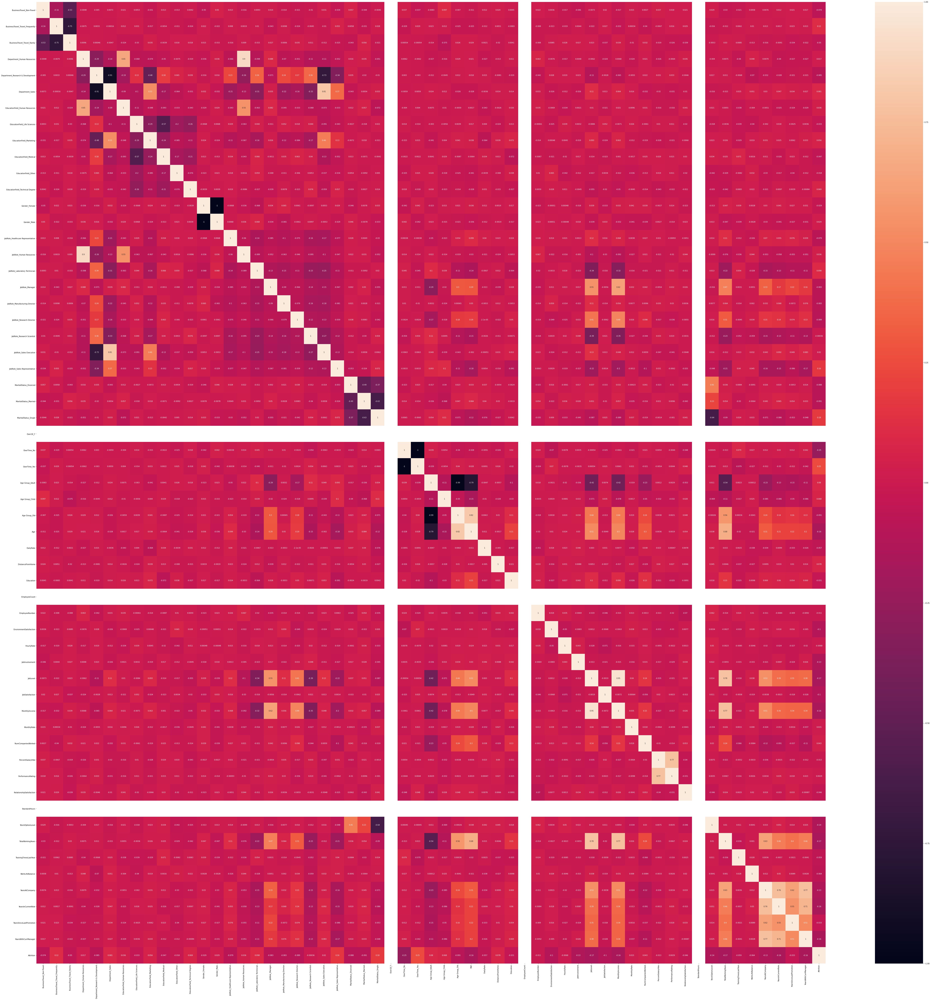

In [32]:
plt.figure(figsize=(100,100))
sns.heatmap(final_df.corr(),annot=True)

### 4) Explore the Data using Exploratory Data Analysis - For pairs of Y and all Xs

In [33]:
final_df.corr()['Attrition']

BusinessTravel_Non-Travel           -0.074457
BusinessTravel_Travel_Frequently     0.115143
BusinessTravel_Travel_Rarely        -0.049538
Department_Human Resources           0.016832
Department_Research & Development   -0.085293
Department_Sales                     0.080855
EducationField_Human Resources       0.036466
EducationField_Life Sciences        -0.032703
EducationField_Marketing             0.055781
EducationField_Medical              -0.046999
EducationField_Other                -0.017898
EducationField_Technical Degree      0.069355
Gender_Female                       -0.029453
Gender_Male                          0.029453
JobRole_Healthcare Representative   -0.078696
JobRole_Human Resources              0.036215
JobRole_Laboratory Technician        0.098290
JobRole_Manager                     -0.083316
JobRole_Manufacturing Director      -0.082994
JobRole_Research Director           -0.088870
JobRole_Research Scientist          -0.000360
JobRole_Sales Executive           

### 5) Visualize all the distribution, relationships

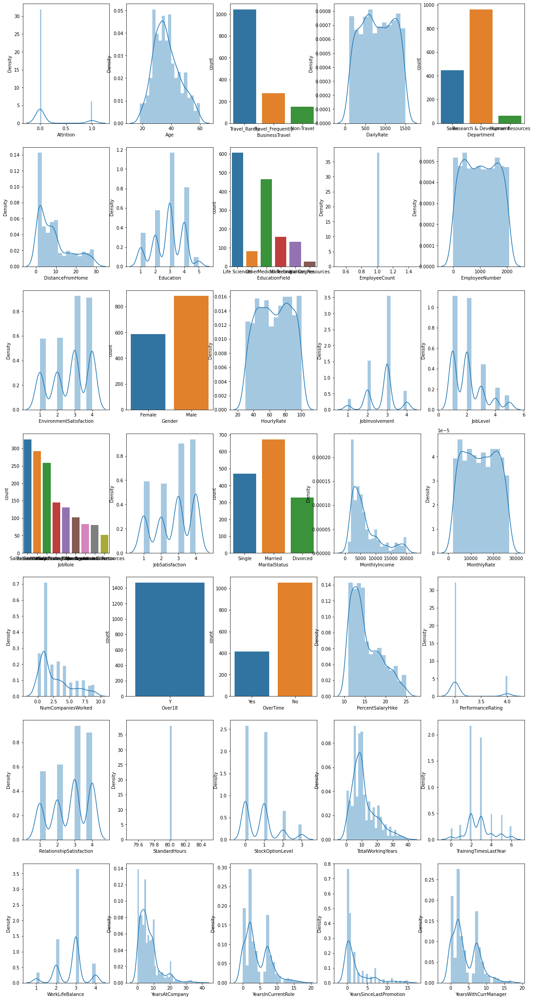

In [34]:
plt.figure(figsize=(20,40))
x=1
for i in df.columns:
    if(df[i].dtypes=="object"):
        plt.subplot(7,5,x)
        sns.countplot(df[i])
        x=x+1
    else:
        plt.subplot(7,5,x)
        sns.distplot(df[i])
        x=x+1

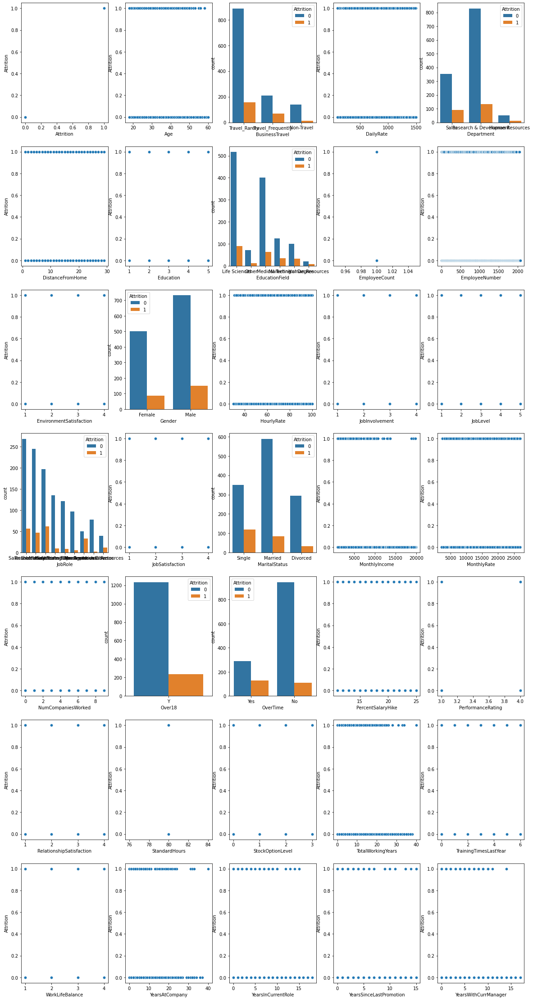

In [35]:
plt.figure(figsize=(20,40))
x=1
for i in df.columns:
    if(df[i].dtypes=="object"):
        plt.subplot(7,5,x)
        sns.countplot(df[i],hue=df.Attrition)
        x=x+1
    else:
        plt.subplot(7,5,x)
        sns.scatterplot(df[i],df['Attrition'])
        x=x+1

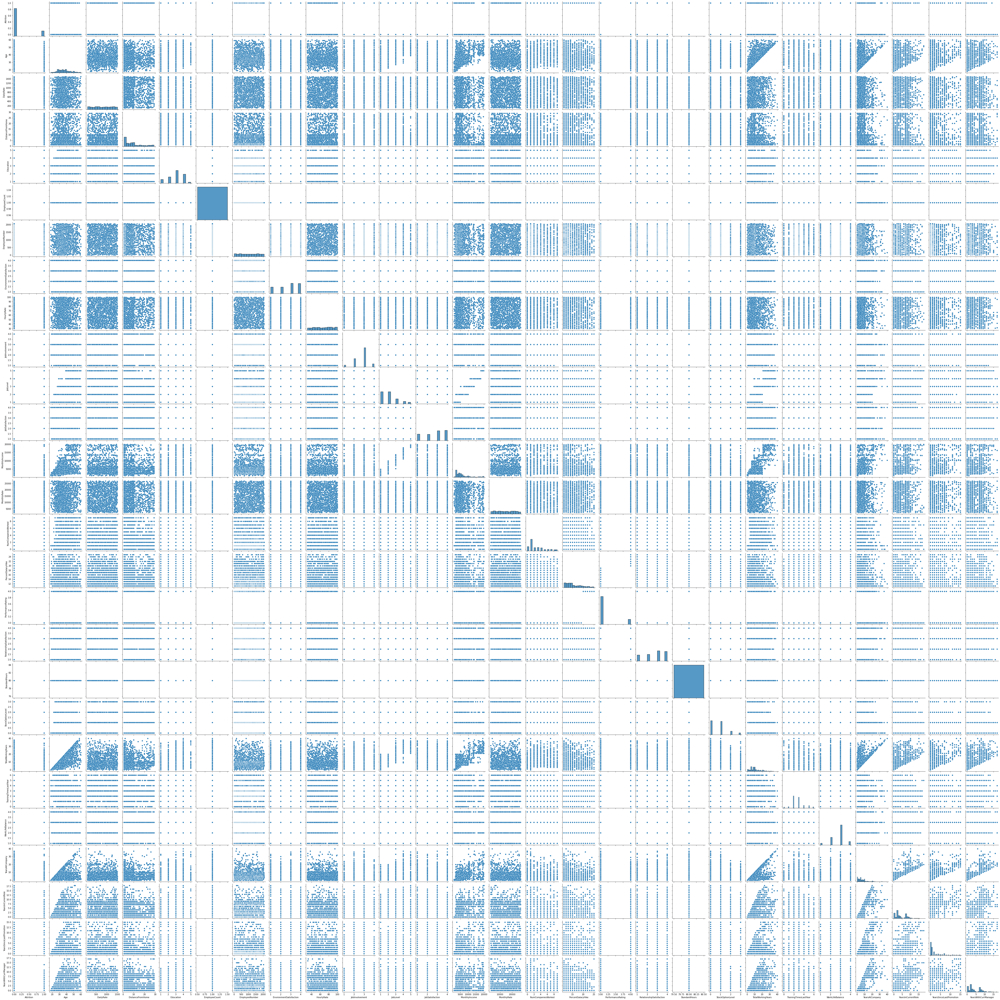

In [36]:
sns.pairplot(df)

### 6) Perform Test of Hypothesis - Compare rates for same level male and female, check relationship between categorical variables like Age and Gender/Gender and Education Field, Age and Income, etc

In [37]:
df['Age'].unique()

array([41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 29, 31, 34, 28, 22, 53,
       24, 21, 42, 44, 46, 39, 43, 50, 26, 48, 55, 45, 56, 23, 51, 40, 54,
       58, 20, 25, 19, 57, 52, 47, 18, 60], dtype=int64)

In [38]:
df['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [39]:
df['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

#### Cross tabulation

In [40]:
AG = pd.crosstab(df['Age'],df['Gender'])
AG

Gender,Female,Male
Age,,
18,4,4
19,4,5
20,6,5
21,6,7
22,5,11
23,1,13
24,11,15
25,6,20
26,14,25


In [41]:
from scipy.stats import chi2_contingency

In [42]:
chi_sqr, p_value, DOF, EXP  = chi2_contingency(AG)

In [43]:
chi_sqr

53.537114950915246

In [44]:
p_value

0.10927801670328505

In [45]:
df['Gender'].unique()

array(['Female', 'Male'], dtype=object)

In [46]:
df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [47]:
df['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

In [48]:
df['EducationField'].value_counts()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

In [49]:
GE = pd.crosstab(df['Gender'],df['EducationField'])
GE

EducationField,Human Resources,Life Sciences,Marketing,Medical,Other,Technical Degree
Gender,,,,,,
Female,8,240,69,190,29,52
Male,19,366,90,274,53,80


In [50]:
chi_sqr, p_value, DOF, EXP  = chi2_contingency(GE)

In [51]:
chi_sqr

2.9414238793151797

In [52]:
p_value

0.7090162522843911

In [53]:
df['Age'].unique()

array([41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 29, 31, 34, 28, 22, 53,
       24, 21, 42, 44, 46, 39, 43, 50, 26, 48, 55, 45, 56, 23, 51, 40, 54,
       58, 20, 25, 19, 57, 52, 47, 18, 60], dtype=int64)

In [54]:
df['MonthlyIncome'].unique()

array([5993, 5130, 2090, ..., 9991, 5390, 4404], dtype=int64)

In [55]:
df['MonthlyIncome'].value_counts()

2342     4
6142     3
2610     3
2559     3
6347     3
        ..
4103     1
2705     1
6796     1
19717    1
10239    1
Name: MonthlyIncome, Length: 1349, dtype: int64

In [56]:
AMI = pd.crosstab(df['Age'],df['MonthlyIncome'])
AMI

MonthlyIncome,1009,1051,1052,1081,1091,1102,1118,1129,1200,1223,1232,1261,1274,1281,1359,1393,1416,1420,1483,1514,1555,1563,1569,1601,1611,1675,1702,1706,1790,1859,1878,1904,1951,2001,2007,2008,2011,2013,2014,2018,2022,2024,2028,2029,2033,2042,2044,2045,2058,2061,...,19033,19038,19045,19049,19068,19081,19094,19141,19144,19161,19187,19189,19190,19197,19202,19232,19237,19246,19272,19328,19331,19392,19406,19419,19431,19436,19502,19513,19517,19537,19545,19566,19586,19613,19626,19627,19636,19658,19665,19701,19717,19740,19833,19845,19847,19859,19926,19943,19973,19999
Age,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
18,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
19,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
20,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
23,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [57]:
chi_sqr, p_value, DOF, EXP  = chi2_contingency(AMI)

In [58]:
chi_sqr

57003.01607044047

In [59]:
p_value

0.12517635416744993

### 7) Perform Regression treating Monthly Rate as Y, and choose prediction error and the best model

In [60]:
final_df.corr()['MonthlyRate']

BusinessTravel_Non-Travel            0.015279
BusinessTravel_Travel_Frequently     0.000344
BusinessTravel_Travel_Rarely        -0.010484
Department_Human Resources          -0.024390
Department_Research & Development   -0.005453
Department_Sales                     0.016388
EducationField_Human Resources       0.009567
EducationField_Life Sciences         0.025545
EducationField_Marketing            -0.011559
EducationField_Medical              -0.001723
EducationField_Other                -0.035606
EducationField_Technical Degree     -0.004535
Gender_Female                        0.041482
Gender_Male                         -0.041482
JobRole_Healthcare Representative    0.003829
JobRole_Human Resources             -0.027470
JobRole_Laboratory Technician       -0.016056
JobRole_Manager                      0.031717
JobRole_Manufacturing Director       0.007711
JobRole_Research Director            0.025875
JobRole_Research Scientist          -0.027008
JobRole_Sales Executive           

In [61]:
final_df

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,1
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,0
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,1
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,0
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873,0
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541,0
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873,0
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.1422

In [62]:
nonCorrWithmonthlyrate = [column for column in final_df if abs(final_df[column].corr(final_df["MonthlyRate"])) < 0.01]
final_df1 = final_df.drop(nonCorrWithmonthlyrate, axis=1)
final_df1

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Other,Gender_Female,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,MonthlyIncome,MonthlyRate,NumCompaniesWorked,StandardHours,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Attrition
0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,-0.108350,0.726020,2.125136,0.0,-0.932014,-0.421642,-0.164613,-0.063296,0.245834,1
1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.291719,1.488876,-0.678049,0.0,0.241988,-0.164511,0.488508,0.764998,0.806541,0
2,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,1,0,1,1,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,-0.937654,-1.674841,1.324226,0.0,-0.932014,-0.550208,-1.144294,-1.167687,-1.155935,1
3,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,-0.763634,1.243211,-0.678049,0.0,-0.932014,-0.421642,0.161947,0.764998,-1.155935,0
4,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,1,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.644858,0.325900,2.525591,0.0,0.241988,-0.678774,-0.817734,-0.615492,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,1,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,-0.835451,-0.284329,0.523316,0.0,0.241988,0.735447,-0.327893,-0.615492,-0.314873,0
1466,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,0.741140,1.004010,0.523316,0.0,0.241988,-0.293077,-0.001333,0.764998,0.806541,0
1467,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.076690,-1.284418,-0.678049,0.0,0.241988,-0.678774,-0.164613,-0.615492,-0.314873,0
1468,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.236474,-0.150393,-0.277594,0.0,-0.932014,0.735447,0.325228,0.488900,1.086895,0


In [63]:
Final_df = final_df1.drop(["MonthlyRate"],axis=1)

In [64]:
Final_df

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Other,Gender_Female,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,MonthlyIncome,NumCompaniesWorked,StandardHours,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Attrition
0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,-0.108350,2.125136,0.0,-0.932014,-0.421642,-0.164613,-0.063296,0.245834,1
1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.291719,-0.678049,0.0,0.241988,-0.164511,0.488508,0.764998,0.806541,0
2,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,1,0,1,1,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,-0.937654,1.324226,0.0,-0.932014,-0.550208,-1.144294,-1.167687,-1.155935,1
3,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,1,1,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,-0.763634,-0.678049,0.0,-0.932014,-0.421642,0.161947,0.764998,-1.155935,0
4,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,1,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.644858,2.525591,0.0,0.241988,-0.678774,-0.817734,-0.615492,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,1,0,1,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,-0.835451,0.523316,0.0,0.241988,0.735447,-0.327893,-0.615492,-0.314873,0
1466,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,0.741140,0.523316,0.0,0.241988,-0.293077,-0.001333,0.764998,0.806541,0
1467,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.076690,-0.678049,0.0,0.241988,-0.678774,-0.164613,-0.615492,-0.314873,0
1468,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.236474,-0.277594,0.0,-0.932014,0.735447,0.325228,0.488900,1.086895,0


#### Multicolinearity

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = Final_df.columns
vif['VIF'] = [variance_inflation_factor(Final_df.values,i) for i in range(Final_df.shape[1])]
vif

,Features,VIF
0,BusinessTravel_Non-Travel,1.443079
1,BusinessTravel_Travel_Rarely,1.414884
2,Department_Human Resources,6.376036
3,Department_Sales,4.893546
4,EducationField_Life Sciences,1.187202
5,EducationField_Marketing,1.581020
6,EducationField_Other,1.096789
7,Gender_Female,inf
8,Gender_Male,inf
9,JobRole_Human Resources,6.412652


In [66]:
featurestodrop = vif.loc[vif['VIF']>10]
droplist = featurestodrop['Features']
droplist = list(droplist)
len(droplist)
print(droplist)

['Gender_Female', 'Gender_Male', 'OverTime_No', 'OverTime_Yes', 'Age Group_Adult', 'Age Group_Old', 'JobLevel', 'MonthlyIncome']


In [67]:
df_Att= Final_df.drop(droplist,axis=1)
df_Att

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Other,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,NumCompaniesWorked,StandardHours,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Attrition
0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,1,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,2.125136,0.0,-0.932014,-0.421642,-0.164613,-0.063296,0.245834,1
1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.678049,0.0,0.241988,-0.164511,0.488508,0.764998,0.806541,0
2,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,1.324226,0.0,-0.932014,-0.550208,-1.144294,-1.167687,-1.155935,1
3,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.678049,0.0,-0.932014,-0.421642,0.161947,0.764998,-1.155935,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,2.525591,0.0,0.241988,-0.678774,-0.817734,-0.615492,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,0.523316,0.0,0.241988,0.735447,-0.327893,-0.615492,-0.314873,0
1466,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.523316,0.0,0.241988,-0.293077,-0.001333,0.764998,0.806541,0
1467,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.678049,0.0,0.241988,-0.678774,-0.164613,-0.615492,-0.314873,0
1468,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.277594,0.0,-0.932014,0.735447,0.325228,0.488900,1.086895,0


In [68]:
x = df_Att

In [69]:
x

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Other,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,NumCompaniesWorked,StandardHours,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Attrition
0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,1,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,2.125136,0.0,-0.932014,-0.421642,-0.164613,-0.063296,0.245834,1
1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.678049,0.0,0.241988,-0.164511,0.488508,0.764998,0.806541,0
2,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,1.324226,0.0,-0.932014,-0.550208,-1.144294,-1.167687,-1.155935,1
3,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.678049,0.0,-0.932014,-0.421642,0.161947,0.764998,-1.155935,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,2.525591,0.0,0.241988,-0.678774,-0.817734,-0.615492,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,0.523316,0.0,0.241988,0.735447,-0.327893,-0.615492,-0.314873,0
1466,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.523316,0.0,0.241988,-0.293077,-0.001333,0.764998,0.806541,0
1467,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.678049,0.0,0.241988,-0.678774,-0.164613,-0.615492,-0.314873,0
1468,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.277594,0.0,-0.932014,0.735447,0.325228,0.488900,1.086895,0


In [70]:
y = df[['MonthlyRate']]

In [71]:
y

,MonthlyRate
0,19479
1,24907
2,2396
3,23159
4,16632
...,...
1465,12290
1466,21457
1467,5174
1468,13243


### Divide data in training & testing set

In [72]:
xtrain,xtest,ytrain,ytest= train_test_split(x,y,test_size=0.25,random_state=25)

### Model Building

## Linear Regression

In [73]:
lin_model = LinearRegression()
lin_model.fit(xtrain,ytrain)

LinearRegression()

In [74]:
# Training data evaluation
ypredtrain = lin_model.predict(xtrain)

MAE = mean_absolute_error(ytrain,ypredtrain)
print('Mean absolute error:',MAE)

acc_linear = r2_score(ytrain,ypredtrain)
print('Training Accuracy:',acc_linear)

Mean absolute error: 6123.968239564429
Training Accuracy: 0.01751349297820326


In [75]:
# Testing data evaluation
ypredtest = lin_model.predict(xtest)

MAE = mean_absolute_error(ytest,ypredtest)
print('Mean absolute error:',MAE)

acc_linear = r2_score(ytest,ypredtest)
print('Testing Accuracy:',acc_linear)

Mean absolute error: 6164.817934782609
Testing Accuracy: -0.01650754483686856


### Lasso Regression

In [76]:
lasso_model = Lasso()
lasso_model.fit(xtrain,ytrain)

Lasso()

In [77]:
# Training data evaluation
ypredtrain = lasso_model.predict(xtrain)

MAE = mean_absolute_error(ytrain,ypredtrain)
print('Mean absolute error:',MAE)

acc_lasso = r2_score(ytrain,ypredtrain)
print('Training Accuracy:',acc_lasso)

Mean absolute error: 6121.1571988063115
Training Accuracy: 0.01934535595164133


In [78]:
# Testing data evaluation
ypredtest = lasso_model.predict(xtest)

MAE = mean_absolute_error(ytest,ypredtest)
print('Mean absolute error:',MAE)

acc_lasso = r2_score(ytest,ypredtest)
print('Testing Accuracy:',acc_lasso)

Mean absolute error: 6189.8646400047155
Testing Accuracy: -0.02333262771485556


### Ridge Regression

In [79]:
ridge_model = Ridge()
ridge_model.fit(xtrain,ytrain)

Ridge()

In [80]:
# Training data evaluation
ypredtrain = ridge_model.predict(xtrain)

Mean_absolute_error = mean_absolute_error(ytrain,ypredtrain)
print('Mean_absolute_error:',Mean_absolute_error)

acc_ridge = r2_score(ytrain,ypredtrain)
print('Training Accuracy:',acc_ridge)

Mean_absolute_error: 6121.036816827892
Training Accuracy: 0.01934582713731403


In [81]:
# Testing data evaluation
ypredtest = ridge_model.predict(xtest)

Mean_absolute_error = mean_absolute_error(ytest,ypredtest)
print('Mean_absolute_error:',Mean_absolute_error)

acc_ridge = r2_score(ytest,ypredtest)
print('Testing Accuracy:',acc_ridge)

Mean_absolute_error: 6190.905298336976
Testing Accuracy: -0.023655552374451494


## KNeighborsRegressor

In [82]:
from sklearn.neighbors import KNeighborsRegressor

In [83]:
KNN_model = KNeighborsRegressor()
KNN_model.fit(xtrain,ytrain)

KNeighborsRegressor()

In [84]:
# Training data evaluation
ypredtrain = KNN_model.predict(xtrain)

acc_KNR = r2_score(ytrain,ypredtrain)
print('Training accuracy:',acc_KNR )

Training accuracy: 0.21360805483649958


In [85]:
# Testing data evaluation
ypredtest = KNN_model.predict(xtest)
# ypredtest

acc_KNR  = r2_score(ytest,ypredtest)
print('Testing accuracy:',acc_KNR )

Testing accuracy: -0.15435468903713745


## Decision Tree

In [86]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

In [87]:
dt_reg = DecisionTreeRegressor()
dt_reg.fit(xtrain, ytrain)

DecisionTreeRegressor()

In [88]:
ypredtrain = dt_reg.predict(xtrain)

mse = mean_squared_error(ytrain, ypredtrain)
print("MSE :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

acc_DT = r2_score(ytrain, ypredtrain)
print("Training accuracy :",acc_DT)

MSE : 0.0
RMSE : 0.0
Training accuracy : 1.0


In [89]:
ypred = dt_reg.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE :",mse)

rmse = np.sqrt(mse)
print("RMSE :",rmse)

acc_DT = r2_score(ytest, ypred)
print("Testing accuracy :",acc_DT)

MSE : 101312354.08152173
RMSE : 10065.403821085458
Testing accuracy : -1.0247599731746173


In [90]:
# dt_reg = DecisionTreeRegressor()

# hyp_grid = {'criterion':['mse','mae'],
#             'max_depth':np.arange(3,15),
#             'min_samples_split':np.arange(2,20),
#             'min_samples_leaf':np.arange(2,15)}

# gscv_dt_reg = GridSearchCV(dt_reg,hyp_grid,cv=5)
# gscv_dt_reg.fit(xtrain,ytrain)

In [91]:
# gscv_dt_reg.best_estimator_

In [92]:
# dt_reg = DecisionTreeRegressor(criterion='mae', max_depth=3, min_samples_leaf=2, min_samples_split=5)
# dt_reg.fit(xtrain, ytrain)

In [93]:
# ypredtrain = dt_reg.predict(xtrain)

# mse = mean_squared_error(ytrain, ypredtrain)
# print("MSE :",mse)

# rmse = np.sqrt(mse)
# print("RMSE :",rmse)

# acc_DT = r2_score(ytrain, ypredtrain)
# print("Training accuracy :",acc_DT)

In [94]:
# ypred = dt_reg.predict(xtest)

# mse = mean_squared_error(ytest, ypred)
# print("MSE :",mse)

# rmse = np.sqrt(mse)
# print("RMSE :",rmse)

# acc_DT = r2_score(ytest, ypred)
# print("Testing accuracy :",acc_DT)

In [95]:
# plt.figure(figsize=(200,150))
# tree = plot_tree(dt_reg,feature_names=x.columns,filled=True)
# plt.savefig('dt_reg.png')

### 8) Form Classification Model using Y=attrition and choose the best model

In [96]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,recall_score,precision_score,f1_score

In [97]:
final_df

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,1
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,0
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,1
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,0
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873,0
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541,0
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873,0
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.1422

In [98]:
Final_df_class = final_df.drop(["Attrition"],axis=1)

In [99]:
Final_df_class

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.6608

In [100]:
x = Final_df_class

In [101]:
x

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.6608

In [102]:
 y = df[['Attrition']]

In [103]:
y

,Attrition
0,1
1,0
2,1
3,0
4,0
...,...
1465,0
1466,0
1467,0
1468,0


### Divide data in training & testing set

In [104]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.25,random_state=25,stratify=y)

### Model Building

## Logistic Regression

In [105]:
log_model = LogisticRegression()
log_model.fit(xtrain,ytrain)

LogisticRegression()

In [106]:
# Training data evaluation
ypredtrain = log_model.predict(xtrain)

Accuracy_log = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_log)

confusionmatrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion matrix: \n',confusionmatrix)

Precision = precision_score(ytrain,ypredtrain)
print('Precision:',Precision)

Recall = recall_score(ytrain,ypredtrain)
print('Recall:',Recall)

F1score = f1_score(ytrain,ypredtrain)
print('F1score:',F1score)

Training Accuracy: 0.8892921960072595
Confusion matrix: 
 [[903  21]
 [101  77]]
Precision: 0.7857142857142857
Recall: 0.43258426966292135
F1score: 0.5579710144927537


In [107]:
# Testing data evaluation
ypredtest = log_model.predict(xtest)

Accuracy_log = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_log)

confusionmatrix = confusion_matrix(ytest,ypredtest)
print('Confusion matrix: \n',confusionmatrix)

Precision = precision_score(ytest,ypredtest)
print('Precision:',Precision)

Recall = recall_score(ytest,ypredtest)
print('Recall:',Recall)

F1score = f1_score(ytest,ypredtest)
print('F1score:',F1score)

Testing Accuracy: 0.8831521739130435
Confusion matrix: 
 [[297  12]
 [ 31  28]]
Precision: 0.7
Recall: 0.4745762711864407
F1score: 0.5656565656565656


## KNN

In [108]:
from sklearn.neighbors import KNeighborsClassifier

In [109]:
Knn_model = KNeighborsClassifier()
Knn_model.fit(xtrain,ytrain)

KNeighborsClassifier()

In [110]:
# Training data evaluation
ypredtrain = Knn_model.predict(xtrain)

Accuracy_KNN = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_KNN)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix:\n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report:\n',Classification_report)

Training Accuracy: 0.8593466424682396
Confusion_matrix:
 [[915   9]
 [146  32]]
Classification_report:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       924
           1       0.78      0.18      0.29       178

    accuracy                           0.86      1102
   macro avg       0.82      0.59      0.61      1102
weighted avg       0.85      0.86      0.82      1102



In [111]:
# Testing data evaluation
ypredtest = Knn_model.predict(xtest)
# ypredtest

Accuracy_KNN = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_KNN)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix:\n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report:\n',Classification_report)

Testing Accuracy: 0.8315217391304348
Confusion_matrix:
 [[302   7]
 [ 55   4]]
Classification_report:
               precision    recall  f1-score   support

           0       0.85      0.98      0.91       309
           1       0.36      0.07      0.11        59

    accuracy                           0.83       368
   macro avg       0.60      0.52      0.51       368
weighted avg       0.77      0.83      0.78       368



In [112]:
knn_model = KNeighborsClassifier()
hyp_grid = {'n_neighbors':np.arange(3,40),'p':[1,2]}

gscv_knn_model = GridSearchCV(knn_model,hyp_grid,cv=5)
gscv_knn_model.fit(xtrain,ytrain)
gscv_knn_model.best_estimator_

KNeighborsClassifier(n_neighbors=3, p=1)

In [113]:
Knn_model = KNeighborsClassifier(n_neighbors=7, p=1)
Knn_model.fit(xtrain,ytrain)

KNeighborsClassifier(n_neighbors=7, p=1)

In [114]:
# Training data evaluation
ypredtrain = Knn_model.predict(xtrain)

Accuracy_KNN = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_KNN)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix:\n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report:\n',Classification_report)

Training Accuracy: 0.8647912885662432
Confusion_matrix:
 [[919   5]
 [144  34]]
Classification_report:
               precision    recall  f1-score   support

           0       0.86      0.99      0.93       924
           1       0.87      0.19      0.31       178

    accuracy                           0.86      1102
   macro avg       0.87      0.59      0.62      1102
weighted avg       0.87      0.86      0.83      1102



In [115]:
# Testing data evaluation
ypredtest = Knn_model.predict(xtest)
# ypredtest

Accuracy_KNN = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_KNN)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix:\n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report:\n',Classification_report)

Testing Accuracy: 0.8478260869565217
Confusion_matrix:
 [[306   3]
 [ 53   6]]
Classification_report:
               precision    recall  f1-score   support

           0       0.85      0.99      0.92       309
           1       0.67      0.10      0.18        59

    accuracy                           0.85       368
   macro avg       0.76      0.55      0.55       368
weighted avg       0.82      0.85      0.80       368



## Baysian

In [116]:
from sklearn.naive_bayes import BernoulliNB

In [117]:
baysian_model = BernoulliNB()
baysian_model.fit(xtrain,ytrain)

BernoulliNB()

In [118]:
# Training data evaluation
ypredtrain = baysian_model.predict(xtrain)

Accuracy_bay = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_bay)

Training Accuracy: 0.8303085299455535


In [119]:
# Testing data evaluation
ypredtest = baysian_model.predict(xtest)

Accuracy_bay = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_bay)

Testing Accuracy: 0.8478260869565217


## Decision Tree

In [120]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [121]:
dt_model = DecisionTreeClassifier()
dt_model.fit(xtrain,ytrain)

DecisionTreeClassifier()

In [122]:
# Training data evaluation
ypredtrain = dt_model.predict(xtrain)

Accuracy_DTC = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_DTC)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report: \n',Classification_report)

Training Accuracy: 1.0
Confusion_matrix: 
 [[924   0]
 [  0 178]]
Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       924
           1       1.00      1.00      1.00       178

    accuracy                           1.00      1102
   macro avg       1.00      1.00      1.00      1102
weighted avg       1.00      1.00      1.00      1102



In [123]:
# Testing data evaluation
ypredtest = dt_model.predict(xtest)

Accuracy_DTC = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_DTC)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report: \n',Classification_report)

Testing Accuracy: 0.7961956521739131
Confusion_matrix: 
 [[271  38]
 [ 37  22]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.88      0.88      0.88       309
           1       0.37      0.37      0.37        59

    accuracy                           0.80       368
   macro avg       0.62      0.62      0.62       368
weighted avg       0.80      0.80      0.80       368



#### Hyperparameter tuning

In [124]:
dt_model = DecisionTreeClassifier()

hyp_grid = {'criterion':['gini','entropy'],
            'max_depth': np.arange(3,15),
            'min_samples_split':np.arange(2,20),
            'min_samples_leaf':np.arange(1,15)}

gscv_dt_model = GridSearchCV(dt_model,hyp_grid,cv=5)
gscv_dt_model.fit(xtrain,ytrain)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19])})

In [125]:
gscv_dt_model.best_estimator_

DecisionTreeClassifier(max_depth=3, min_samples_leaf=6)

In [126]:
dt_model = DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=6,min_samples_split=5)
dt_model.fit(xtrain,ytrain)

DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=6,
                       min_samples_split=5)

In [127]:
# Training data evaluation
ypredtrain = dt_model.predict(xtrain)

Accuracy_DTC = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_DTC)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report: \n',Classification_report)

Training Accuracy: 0.8584392014519057
Confusion_matrix: 
 [[911  13]
 [143  35]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       924
           1       0.73      0.20      0.31       178

    accuracy                           0.86      1102
   macro avg       0.80      0.59      0.62      1102
weighted avg       0.84      0.86      0.82      1102



In [128]:
# Testing data evaluation
ypredtest = dt_model.predict(xtest)

Accuracy_DTC = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_DTC)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report: \n',Classification_report)

Testing Accuracy: 0.8614130434782609
Confusion_matrix: 
 [[304   5]
 [ 46  13]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.87      0.98      0.92       309
           1       0.72      0.22      0.34        59

    accuracy                           0.86       368
   macro avg       0.80      0.60      0.63       368
weighted avg       0.85      0.86      0.83       368



#### Plot decision tree after hyperparameter tuning

In [129]:
plt.figure(figsize=(200,150))
tree = plot_tree(dt_model,feature_names=x.columns,class_names=['0','1'],filled=True)
plt.savefig('dt_afterhypt.png')

## SVM

In [130]:
from sklearn.svm import SVC

In [131]:
svc_model = SVC()
svc_model.fit(xtrain,ytrain)

SVC()

In [132]:
# Training data evaluation
ypredtrain = svc_model.predict(xtrain)
# ypredtest

Accuracy_SVM = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_SVM)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report: \n',Classification_report)

Training Accuracy: 0.911978221415608
Confusion_matrix: 
 [[924   0]
 [ 97  81]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.90      1.00      0.95       924
           1       1.00      0.46      0.63       178

    accuracy                           0.91      1102
   macro avg       0.95      0.73      0.79      1102
weighted avg       0.92      0.91      0.90      1102



In [133]:
# Testing data evaluation
ypredtest = svc_model.predict(xtest)
# ypredtest

Accuracy_SVM = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_SVM)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report: \n',Classification_report)

Testing Accuracy: 0.8722826086956522
Confusion_matrix: 
 [[308   1]
 [ 46  13]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.87      1.00      0.93       309
           1       0.93      0.22      0.36        59

    accuracy                           0.87       368
   macro avg       0.90      0.61      0.64       368
weighted avg       0.88      0.87      0.84       368



In [134]:
svc_model = SVC()

hyp_grid = {'C':np.arange(0,50),
            'kernel' : ['linear', 'poly', 'rbf', 'sigmoid']}

gscv_scv_model = GridSearchCV(svc_model,hyp_grid,cv=5)

gscv_scv_model.fit(xtrain,ytrain)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [135]:
gscv_scv_model.best_estimator_

SVC(C=1, kernel='linear')

In [136]:
svc_model = SVC(C=1, kernel='linear')
svc_model.fit(xtrain,ytrain)

SVC(C=1, kernel='linear')

In [137]:
# Training data evaluation
ypredtrain = svc_model.predict(xtrain)
# ypredtest

Accuracy_SVM = accuracy_score(ytrain,ypredtrain)
print('Training Accuracy:',Accuracy_SVM)

Confusion_matrix = confusion_matrix(ytrain,ypredtrain)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytrain,ypredtrain)
print('Classification_report: \n',Classification_report)

Training Accuracy: 0.8920145190562614
Confusion_matrix: 
 [[913  11]
 [108  70]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.89      0.99      0.94       924
           1       0.86      0.39      0.54       178

    accuracy                           0.89      1102
   macro avg       0.88      0.69      0.74      1102
weighted avg       0.89      0.89      0.87      1102



In [138]:
# Testing data evaluation
ypredtest = svc_model.predict(xtest)
# ypredtest

Accuracy_SVM = accuracy_score(ytest,ypredtest)
print('Testing Accuracy:',Accuracy_SVM)

Confusion_matrix = confusion_matrix(ytest,ypredtest)
print('Confusion_matrix: \n',Confusion_matrix)

Classification_report = classification_report(ytest,ypredtest)
print('Classification_report: \n',Classification_report)

Testing Accuracy: 0.8967391304347826
Confusion_matrix: 
 [[300   9]
 [ 29  30]]
Classification_report: 
               precision    recall  f1-score   support

           0       0.91      0.97      0.94       309
           1       0.77      0.51      0.61        59

    accuracy                           0.90       368
   macro avg       0.84      0.74      0.78       368
weighted avg       0.89      0.90      0.89       368



## ANN

In [139]:
import tensorflow as tf
import keras

In [140]:
from keras import Sequential
from keras.layers import Dense , Dropout

In [141]:
std_scaler = StandardScaler()
xtrain_scaled = std_scaler.fit_transform(xtrain)
xtest_scaled = std_scaler.fit_transform(xtest)

In [142]:
xtrain_scaled

array([[-0.33299714,  2.04892977, -1.55639335, ...,  1.33370758,
         1.19896149,  0.80217198],
       [-0.33299714,  2.04892977, -1.55639335, ..., -0.6096661 ,
        -0.36948053, -0.60635817],
       [ 3.00302877, -0.48805968, -1.55639335, ..., -0.33204129,
        -0.36948053, -0.60635817],
       ...,
       [-0.33299714, -0.48805968,  0.6425111 , ..., -0.6096661 ,
        -0.05579213, -0.60635817],
       [-0.33299714, -0.48805968,  0.6425111 , ..., -1.16491573,
        -0.68316894, -1.16977023],
       [-0.33299714, -0.48805968,  0.6425111 , ..., -0.33204129,
        -0.68316894, -0.04294611]])

In [143]:
xtest_scaled

array([[-0.34921515, -0.46316461,  0.63185405, ...,  0.72604239,
        -0.66802355,  1.09633725],
       [-0.34921515, -0.46316461,  0.63185405, ...,  1.26965094,
         2.04336617,  0.54328433],
       [-0.34921515,  2.15905962, -1.58264396, ..., -0.08937043,
        -0.66802355, -0.56282152],
       ...,
       [-0.34921515, -0.46316461,  0.63185405, ...,  0.72604239,
        -0.36675803,  0.81981079],
       [-0.34921515, -0.46316461,  0.63185405, ..., -0.08937043,
        -0.36675803, -0.56282152],
       [-0.34921515, -0.46316461,  0.63185405, ...,  1.54145521,
        -0.06549251,  1.37286372]])

In [144]:
nn = Sequential()
 # Create input layer and 1st Hidden layer
nn.add(Dense(units = 6,activation='relu',kernel_initializer='he_uniform',input_dim=(58)))  

# Add 1st Dropout layer
nn.add(Dropout(rate=0.5))

# Add 2nd Hidden layer
nn.add(Dense(units = 6,activation='relu',kernel_initializer='he_uniform')) 

# Add 2nd Dropout layer
nn.add(Dropout(rate=0.5))

# Add output layer
nn.add(Dense(units=1 ,activation='sigmoid', kernel_initializer='glorot_uniform'))

In [145]:
# Compile
nn.compile(optimizer='Adam',loss='binary_crossentropy' ,metrics=['accuracy','Recall','Precision'])

In [146]:
# Training
model = nn.fit(xtrain_scaled,ytrain,validation_split=0.3,epochs=200,batch_size=20)

Epoch 1/200
39/39 [==============================] - 1s 11ms/step - loss: 1.1075 - accuracy: 0.5772 - recall: 0.3629 - precision: 0.1541 - val_loss: 0.7224 - val_accuracy: 0.5227 - val_recall: 0.4630 - val_precision: 0.1623
Epoch 2/200
39/39 [==============================] - 0s 3ms/step - loss: 0.9319 - accuracy: 0.6446 - recall: 0.3468 - precision: 0.1822 - val_loss: 0.6553 - val_accuracy: 0.6012 - val_recall: 0.3333 - val_precision: 0.1579
Epoch 3/200
39/39 [==============================] - 0s 3ms/step - loss: 0.8673 - accuracy: 0.6485 - recall: 0.2339 - precision: 0.1415 - val_loss: 0.5992 - val_accuracy: 0.7130 - val_recall: 0.2407 - val_precision: 0.1940
Epoch 4/200
39/39 [==============================] - 0s 3ms/step - loss: 0.7630 - accuracy: 0.7082 - recall: 0.3468 - precision: 0.2299 - val_loss: 0.5626 - val_accuracy: 0.7704 - val_recall: 0.1667 - val_precision: 0.2250
Epoch 5/200
39/39 [==============================] - 0s 3ms/step - loss: 0.7281 - accuracy: 0.7160 - recall

Epoch 37/200
39/39 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.8431 - recall: 0.0565 - precision: 0.6364 - val_loss: 0.4140 - val_accuracy: 0.8369 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 38/200
39/39 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.8392 - recall: 0.0242 - precision: 0.5000 - val_loss: 0.4123 - val_accuracy: 0.8369 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 39/200
39/39 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.8457 - recall: 0.0645 - precision: 0.7273 - val_loss: 0.4120 - val_accuracy: 0.8369 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 40/200
39/39 [==============================] - 0s 3ms/step - loss: 0.4100 - accuracy: 0.8482 - recall: 0.0887 - precision: 0.7333 - val_loss: 0.4104 - val_accuracy: 0.8369 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 41/200
39/39 [==============================] - 0s 3ms/step - loss

Epoch 73/200
39/39 [==============================] - 0s 4ms/step - loss: 0.3679 - accuracy: 0.8690 - recall: 0.2339 - precision: 0.8286 - val_loss: 0.3818 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 74/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3696 - accuracy: 0.8677 - recall: 0.2016 - precision: 0.8929 - val_loss: 0.3781 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 75/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3785 - accuracy: 0.8521 - recall: 0.1371 - precision: 0.7083 - val_loss: 0.3808 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 76/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3670 - accuracy: 0.8638 - recall: 0.1855 - precision: 0.8519 - val_loss: 0.3803 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 77/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3632 - accuracy: 0.8573 - re

39/39 [==============================] - 0s 2ms/step - loss: 0.3401 - accuracy: 0.8638 - recall: 0.2097 - precision: 0.7879 - val_loss: 0.3985 - val_accuracy: 0.8429 - val_recall: 0.0370 - val_precision: 1.0000
Epoch 110/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3551 - accuracy: 0.8521 - recall: 0.1371 - precision: 0.7083 - val_loss: 0.4004 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 111/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3634 - accuracy: 0.8508 - recall: 0.1371 - precision: 0.6800 - val_loss: 0.4027 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 112/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3423 - accuracy: 0.8690 - recall: 0.2177 - precision: 0.8710 - val_loss: 0.4051 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 113/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3362 - accuracy: 0.8677 - recall: 0.2

39/39 [==============================] - 0s 2ms/step - loss: 0.3147 - accuracy: 0.8742 - recall: 0.2823 - precision: 0.8140 - val_loss: 0.4441 - val_accuracy: 0.8459 - val_recall: 0.0556 - val_precision: 1.0000
Epoch 146/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3114 - accuracy: 0.8703 - recall: 0.2742 - precision: 0.7727 - val_loss: 0.4483 - val_accuracy: 0.8459 - val_recall: 0.0556 - val_precision: 1.0000
Epoch 147/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3372 - accuracy: 0.8651 - recall: 0.2339 - precision: 0.7632 - val_loss: 0.4505 - val_accuracy: 0.8399 - val_recall: 0.0185 - val_precision: 1.0000
Epoch 148/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3239 - accuracy: 0.8729 - recall: 0.2661 - precision: 0.8250 - val_loss: 0.4476 - val_accuracy: 0.8429 - val_recall: 0.0370 - val_precision: 1.0000
Epoch 149/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3114 - accuracy: 0.8742 - recall: 0.2

39/39 [==============================] - 0s 3ms/step - loss: 0.3158 - accuracy: 0.8703 - recall: 0.2823 - precision: 0.7609 - val_loss: 0.5172 - val_accuracy: 0.8520 - val_recall: 0.0926 - val_precision: 1.0000
Epoch 182/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3082 - accuracy: 0.8755 - recall: 0.2742 - precision: 0.8500 - val_loss: 0.5207 - val_accuracy: 0.8489 - val_recall: 0.0741 - val_precision: 1.0000
Epoch 183/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3106 - accuracy: 0.8690 - recall: 0.2581 - precision: 0.7805 - val_loss: 0.5184 - val_accuracy: 0.8489 - val_recall: 0.0741 - val_precision: 1.0000
Epoch 184/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3051 - accuracy: 0.8755 - recall: 0.2903 - precision: 0.8182 - val_loss: 0.5218 - val_accuracy: 0.8489 - val_recall: 0.0741 - val_precision: 1.0000
Epoch 185/200
39/39 [==============================] - 0s 3ms/step - loss: 0.3113 - accuracy: 0.8690 - recall: 0.2

In [147]:
ypredtest = nn.predict(xtest_scaled)

12/12 [==============================] - 0s 1ms/step


In [148]:
ypredtest

array([[7.00403871e-06],
       [2.01375801e-02],
       [2.08386332e-02],
       [1.54305641e-02],
       [1.56443696e-02],
       [6.20237691e-03],
       [6.16207659e-01],
       [6.14443608e-02],
       [1.63564563e-01],
       [1.91319138e-01],
       [3.71395946e-02],
       [4.70247911e-03],
       [7.12879992e-04],
       [1.32478920e-06],
       [4.14357893e-03],
       [2.23876849e-01],
       [1.22454639e-05],
       [5.30072975e-05],
       [7.66702835e-03],
       [3.25985521e-01],
       [4.34142945e-04],
       [4.90957797e-01],
       [5.06092212e-04],
       [4.37691633e-04],
       [5.76561195e-11],
       [7.98794588e-07],
       [1.63564563e-01],
       [1.04545779e-05],
       [4.18183305e-07],
       [2.48038705e-04],
       [1.69291720e-01],
       [2.16423552e-02],
       [1.54807149e-05],
       [1.69287127e-08],
       [2.27092346e-03],
       [5.79010043e-03],
       [6.75049936e-03],
       [2.08267150e-03],
       [2.55686522e-01],
       [2.71103084e-01],


In [149]:
ypredtest = list(map(int,(ypredtest>0.5)))

In [150]:
print(ypredtest)

[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 

In [151]:
Accuracy = accuracy_score(ytest,ypredtest)
Accuracy

0.8478260869565217

In [152]:
model.history

{'loss': [1.107539176940918,
  0.9318690299987793,
  0.8673455119132996,
  0.762957751750946,
  0.7280856370925903,
  0.6799255609512329,
  0.590929388999939,
  0.6241587400436401,
  0.5828232169151306,
  0.5740485191345215,
  0.5767301321029663,
  0.5268868803977966,
  0.544079065322876,
  0.5269943475723267,
  0.5226647853851318,
  0.5334508419036865,
  0.504584789276123,
  0.5371523499488831,
  0.4878067374229431,
  0.47812676429748535,
  0.48687058687210083,
  0.49389487504959106,
  0.4821391701698303,
  0.47048336267471313,
  0.4750666916370392,
  0.45033594965934753,
  0.4498889744281769,
  0.4429076015949249,
  0.44621431827545166,
  0.4584064781665802,
  0.4498059153556824,
  0.45500698685646057,
  0.42757120728492737,
  0.414208322763443,
  0.43678832054138184,
  0.44216349720954895,
  0.43674758076667786,
  0.4281451404094696,
  0.43243327736854553,
  0.41004228591918945,
  0.4130152463912964,
  0.4193318784236908,
  0.40879401564598083,
  0.40928640961647034,
  0.41408118605

In [153]:
model.history.keys()

dict_keys(['loss', 'accuracy', 'recall', 'precision', 'val_loss', 'val_accuracy', 'val_recall', 'val_precision'])

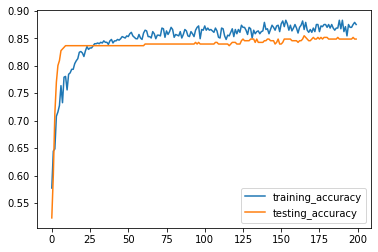

In [154]:
# Visualizing accuracy
plt.plot(model.history['accuracy'])
plt.plot(model.history['val_accuracy'])
plt.legend(['training_accuracy','testing_accuracy'])

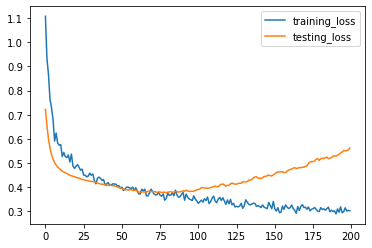

In [155]:
# Visualizing loss
plt.plot(model.history['loss'])
plt.plot(model.history['val_loss'])
plt.legend(['training_loss','testing_loss'])

### Final Predictions

In [156]:
Predictions = log_model.predict(xtest)
Predictions

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [157]:
pd.options.display.max_rows=368

In [158]:
final_output = pd.DataFrame(Predictions,columns=['Final_Predictions'])
final_output

,Final_Predictions
0,0
1,0
2,0
3,0
4,0
5,0
6,1
7,0
8,0
9,0


### 9) Clustering - Find intersting clusters using K-means, Heirarchical and DBSCAN clustering. Connect to Domain scenario and its usefulness in analysis (Ignore Attrition Column)

### a) Grouping of Emploees

In [159]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

In [160]:
x

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,1.004010,0.523316,-0.057267,-0.426230,-1.584178,0.0,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.660853,-0.076690,-1.284418,-0.678049,1.309341,2.346151,-0.658973,0.0,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873
1468,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.322365,0.546677,-0.887515,0.085049,0.0,1.728317,1.169781,-0.142264,-1.026167,-0.057788,-0.6608

#### Reducing the dimensionality of the Data

In [161]:
pca = PCA(n_components = 2)
X_principal = pca.fit_transform(x)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']

In [162]:
X_principal

,P1,P2
0,-0.123227,1.753045
1,0.708353,-1.417164
2,-2.489738,1.244741
3,-0.952054,-0.341545
4,-1.946408,0.797334
...,...,...
1465,-0.837692,0.375050
1466,0.762103,-0.371828
1467,-1.293807,-0.939619
1468,1.156983,0.414920


## K-Means Clustering

In [163]:
kmeans_model = KMeans(n_clusters=3)  # n_clusters=8  >> default
kmeans_model.fit(X_principal)

KMeans(n_clusters=3)

In [164]:
kmeans_model.inertia_

3686.284119036042

In [165]:
y_var = kmeans_model.fit_predict(X_principal)
y_var

array([1, 2, 1, ..., 1, 2, 1])

In [166]:
index_0 = np.where(y_var==0)
index_0

(array([  18,   25,   28,   29,   45,   62,   63,   65,   85,   90,   93,
          95,   98,  105,  106,  110,  112,  119,  123,  126,  147,  158,
         165,  178,  186,  187,  189,  190,  194,  213,  218,  231,  233,
         235,  237,  244,  257,  263,  268,  270,  271,  279,  280,  290,
         295,  300,  311,  314,  316,  326,  329,  367,  375,  379,  390,
         392,  400,  401,  406,  408,  411,  417,  424,  425,  427,  429,
         445,  448,  465,  466,  473,  477,  489,  492,  497,  502,  510,
         533,  534,  535,  538,  544,  552,  561,  568,  584,  588,  592,
         595,  609,  616,  624,  625,  627,  646,  649,  653,  674,  677,
         695,  699,  701,  714,  716,  721,  723,  728,  736,  738,  741,
         743,  745,  746,  749,  750,  755,  758,  760,  766,  770,  771,
         774,  787,  789,  799,  804,  806,  810,  812,  813,  814,  821,
         837,  838,  851,  858,  861,  867,  869,  890,  894,  898,  899,
         904,  907,  913,  914,  916, 

In [167]:
cluster_0 = x.iloc[index_0]
cluster_0

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
18,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1.760373,1.032581,-0.887515,1.061787,0.0,-1.664727,-1.575686,0.595834,-1.026167,1.749610,1.153254,1.896174,1.083275,-0.277594,0.216054,-0.426230,0.266233,0.0,-0.932014,2.535365,0.155707,0.338096,2.937711,1.041095,0.252146,0.806541
25,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,1,1.760373,1.188765,-0.517332,0.085049,0.0,-1.649772,0.254625,-0.388296,0.379672,2.653309,0.246200,2.675333,-0.502870,0.523316,-1.150554,-0.426230,1.191438,0.0,0.241988,1.892537,0.155707,-1.077862,1.141629,2.421585,0.562576,1.086895
28,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0.774856,-0.806912,-0.270544,1.061787,0.0,-1.643126,-1.575686,-1.175601,-1.026167,0.845911,1.153254,0.795747,-1.717284,0.122861,-0.330589,-0.426230,1.191438,0.0,0.241988,1.635406,0.931603,0.338096,2.447870,0.488900,0.873006,3.610079
29,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0.993860,-0.241677,-0.887515,1.061787,0.0,-1.639803,-0.660531,0.841867,0.379672,2.653309,-1.567907,2.644099,1.195848,0.122861,-0.877232,-0.426230,1.191438,0.0,-0.932014,1.378275,-0.620189,-1.077862,-0.817734,-0.615492,-0.058285,-0.875581
45,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0.446350,1.382135,0.346427,0.085049,0.0,-1.606570,-0.660531,-0.831155,0.379672,2.653309,0.246200,2.771161,0.276429,-0.678049,-0.877232,-0.426230,1.191438,0.0,-0.932014,1.506840,-2.171982,0.338096,2.447870,2.973780,3.977310,1.086895
62,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1.431867,0.462388,-0.270544,-0.891688,0.0,-1.570014,-0.660531,-1.126394,-1.026167,2.653309,0.246200,2.600116,0.335597,0.923771,-0.877232,-0.426230,1.191438,0.0,0.241988,2.278234,-0.620189,-1.077862,3.264271,-0.339394,3.356449,1.086895
63,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,2.417384,1.568068,1.950552,0.085049,0.0,-1.568353,-1.575686,1.629171,0.379672,0.845911,-1.567907,0.240965,-1.680744,1.724681,-1.150554,-0.426230,1.191438,0.0,-0.932014,2.149668,0.155707,-1.077862,2.284590,3.249878,1.493867,1.367249
65,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1.979376,0.083085,-0.147150,0.085049,0.0,-1.563368,1.169781,-1.618459,0.379672,1.749610,0.246200,1.753601,0.761296,-0.277594,-0.330589,-0.426230,0.266233,0.0,2.589994,1.249709,-0.620189,0.338096,-0.327893,-1.167687,-0.679146,-0.595227
85,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,1,2.088878,1.481299,-0.270544,0.085049,0.0,-1.516842,1.169781,-0.831155,-2.432006,0.845911,1.153254,0.160861,1.037880,0.523316,-1.150554,-0.426230,-1.584178,0.0,-0.932014,3.306758,0.155707,-1.077862,-0.164613,-0.063296,-0.679146,-0.595227
90,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.336849,-0.675520,-1.010909,1.061787,0.0,-1.505211,0.254625,0.59583

In [168]:
index_1 = np.where(y_var==1)
index_1

(array([   0,    2,    3,    4,    6,    7,   10,   12,   13,   14,   16,
          17,   19,   20,   21,   23,   24,   30,   31,   32,   33,   34,
          35,   36,   37,   38,   39,   40,   41,   42,   47,   49,   50,
          51,   52,   53,   54,   57,   66,   67,   68,   69,   70,   71,
          72,   74,   77,   78,   79,   81,   82,   84,   86,   87,   96,
          97,   99,  100,  101,  102,  104,  107,  108,  109,  113,  114,
         115,  118,  122,  125,  127,  128,  130,  131,  132,  135,  136,
         138,  140,  141,  142,  143,  145,  146,  148,  149,  156,  157,
         159,  160,  161,  162,  163,  164,  169,  170,  171,  174,  175,
         176,  177,  179,  180,  181,  182,  183,  184,  191,  192,  193,
         196,  197,  198,  200,  202,  203,  204,  206,  207,  208,  209,
         214,  215,  216,  217,  219,  221,  224,  225,  229,  230,  232,
         234,  238,  239,  240,  241,  242,  245,  246,  248,  249,  250,
         252,  253,  254,  255,  258, 

In [169]:
cluster_1 = x.iloc[index_1]
cluster_1

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
6,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,2.417384,1.292887,-0.764121,0.085049,0.0,-1.686328,0.254625,0.743454,1.785511,-0.961486,-1.567907,-0.814416,-0.611227,0.523316,1.309341,2.346151,-1.584178,0.0,2.589994,0.092620,0.155707,-1.077862,-0.981014,-1.167687,-0.679146,-1.155935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1461,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,1,1.431867,-0.973012,2.320735,0.085049,0.0,1.711700,1.169781,-1.323220,-1.026167,0.845911,-1.567907,0.924509,0.319435,0.523316,-0.603911,-0.426230,-0.658973,0.0,0.241988,1.121144,0.155707,0.338096,-0.654454,-0.615492,-0.058285,-1.155935
1464,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,0,-1.196177,0.903668,-0.517332,0.085049,0.0,1.720008,1.169781,-1.766079,-1.026167,-0.961486,0.246200,-0.751522,0.992907,-1.078504,0.762698,-0.426230,1.191438,0.0,-0.932014,-0.807339,-0.620189,0.338096,-0.491174,-0.615492,-0.679146,-1.155935
1465,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,0.202082,1.703764,-0.891688,0.0,1.721670,0.254625,-1.224807,1.785511,-0.057788,1.153254,-0.835451,-0.284329,0.523316,0.489376,-0.426230,0.266233,0.0,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.057788,-0.66085

In [170]:
index_2 = np.where(y_var==2)
index_2

(array([   1,    5,    8,    9,   11,   15,   22,   26,   27,   43,   44,
          46,   48,   55,   56,   58,   59,   60,   61,   64,   73,   75,
          76,   80,   83,   88,   89,   91,   92,   94,  103,  111,  116,
         117,  120,  121,  124,  129,  133,  134,  137,  139,  144,  150,
         151,  152,  153,  154,  155,  166,  167,  168,  172,  173,  185,
         188,  195,  199,  201,  205,  210,  211,  212,  220,  222,  223,
         226,  227,  228,  236,  243,  247,  251,  256,  261,  266,  269,
         276,  277,  278,  281,  282,  283,  285,  291,  293,  297,  302,
         303,  304,  305,  306,  307,  313,  315,  317,  319,  321,  324,
         325,  334,  338,  339,  341,  342,  343,  344,  353,  355,  359,
         366,  376,  384,  386,  394,  398,  403,  412,  420,  423,  426,
         432,  434,  435,  442,  444,  446,  447,  451,  452,  459,  462,
         467,  468,  475,  484,  491,  503,  506,  508,  509,  514,  518,
         519,  523,  524,  526,  527, 

In [171]:
cluster_2 = x.iloc[index_2]
cluster_2

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
5,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,-0.539166,0.502054,-0.887515,-0.891688,0.0,-1.689652,1.169781,0.645041,0.379672,-0.961486,1.153254,-0.729850,-0.344199,-1.078504,-0.603911,-0.426230,0.266233,0.0,-0.932014,-0.421642,-0.620189,-1.077862,-0.001333,0.764998,0.252146,0.526188
8,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,0.117845,-1.453958,1.703764,0.085049,0.0,-1.683005,1.169781,-1.077188,-1.026167,0.845911,0.246200,0.642338,-0.776644,-1.078504,1.582663,2.346151,-0.658973,0.0,-0.932014,-0.164511,-0.620189,0.338096,0.325228,0.764998,-0.368715,1.086895
9,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,1.230910,2.197341,0.085049,0.0,-1.681343,0.254625,1.383138,0.379672,-0.057788,0.246200,-0.268983,0.318170,1.324226,-0.603911,-0.426230,-0.658973,0.0,1.415991,0.735447,0.155707,-1.077862,-0.001333,0.764998,1.493867,0.806541
11,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,-0.867672,-1.610141,0.716610,-0.891688,0.0,-1.678020,1.169781,-0.831155,-1.026167,-0.057788,0.246200,-0.490811,-0.229237,-1.078504,-0.877232,-0.426230,1.191438,0.0,-0.932014,-0.164511,0.155707,0.338096,0.325228,0.212802,-0.679146,1.086895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,1,0,0,0.117845,-1.134154,0.099639,-0.891688,0.0,1.688438,-1.575686,1.678377,0.379672,-0.057788,1.153254,-0.246461,-1.170861,-0.678049,-1.150554,-0.426230,0.266233,0.0,0.241988,-0.164511,-1.396086,0.338096,0.488508,0.764998,-0.368715,1.367249
1462,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,1,0,0,0.227347,-0.199532,1.827158,-1.868426,0.0,1.713362,-0.660531,-0.289883,-1.026167,1.749610,1.153254,1.174597,-0.770882,-1.078504,-1.150554,-0.426230,-1.584178,0.0,0.241988,1.249709,-0.620189,-1.077862,2.121310,1.317193,2.114728,0.526188
1463,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,-0.648668,-1.183736,-0.517332,0.085049,0.0,1.715024,-0.660531,0.399008,0.379672,-0.057788,-1.567907,0.729454,-1.479348,-1.078504,1.036019,-0.426230,-0.658973,0.0,-0.932014,-0.164511,-0.620189,0.338096,0.325228,-0.063296,-0.368715,0.806541
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.7411

### Elbow method

In [172]:
WCSS_list = []
for k in range(1,10):
    kmeans_model = KMeans(n_clusters=k)  
    kmeans_model.fit(X_principal)
    WCSS = kmeans_model.inertia_
    WCSS_list.append(WCSS)
    print('K >>',k,'WCSS>>',WCSS)

K >> 1 WCSS>> 9899.510474678413
K >> 2 WCSS>> 5212.972971501031
K >> 3 WCSS>> 3686.2254848544867
K >> 4 WCSS>> 2494.5912560339857
K >> 5 WCSS>> 1860.692374538649
K >> 6 WCSS>> 1600.207985793003
K >> 7 WCSS>> 1410.9852036822958
K >> 8 WCSS>> 1250.0847066717606
K >> 9 WCSS>> 1132.191839323547


In [173]:
WCSS

1132.191839323547

In [174]:
WCSS_list

[9899.510474678413,
 5212.972971501031,
 3686.2254848544867,
 2494.5912560339857,
 1860.692374538649,
 1600.207985793003,
 1410.9852036822958,
 1250.0847066717606,
 1132.191839323547]

Text(0.5, 1.0, 'Elbow method graph')

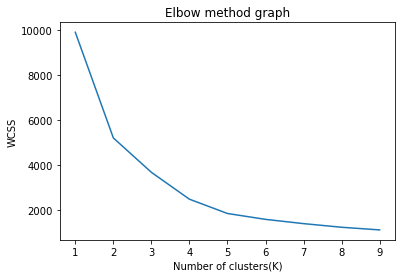

In [175]:
k = range(1,10)
plt.plot(k,WCSS_list)
plt.xlabel('Number of clusters(K)')
plt.ylabel('WCSS')
plt.title('Elbow method graph')

In [176]:
kmeans_model = KMeans(n_clusters=5) 
kmeans_model.fit(X_principal)

KMeans(n_clusters=5)

In [177]:
kmeans_model.inertia_

1860.680999645056

In [178]:
y_means = kmeans_model.fit_predict(X_principal)
y_means

array([0, 1, 0, ..., 4, 1, 4])

#### Grouping of employees

In [179]:
index_0 = np.where(y_means==0)
index_0

(array([   0,    2,    4,    6,   19,   31,   33,   35,   36,   38,   52,
          53,   54,   66,   78,   79,   87,   99,  104,  114,  115,  122,
         130,  132,  135,  141,  142,  156,  157,  159,  174,  175,  183,
         184,  192,  193,  196,  197,  198,  203,  204,  208,  215,  216,
         219,  225,  230,  232,  234,  240,  242,  245,  248,  249,  250,
         253,  254,  258,  265,  273,  275,  286,  287,  291,  298,  299,
         308,  310,  322,  327,  330,  332,  333,  340,  346,  347,  352,
         354,  356,  358,  360,  364,  365,  368,  371,  372,  378,  387,
         388,  389,  391,  393,  395,  396,  409,  413,  428,  431,  433,
         438,  439,  440,  441,  450,  454,  456,  458,  464,  469,  471,
         472,  482,  483,  486,  488,  493,  499,  500,  504,  511,  520,
         525,  528,  539,  542,  543,  547,  548,  549,  551,  554,  556,
         557,  559,  560,  566,  570,  572,  573,  583,  587,  591,  596,
         597,  599,  601,  603,  605, 

In [180]:
Group_0 = x.iloc[index_0]
Group_0

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,0.446350,0.742527,-1.010909,-0.891688,0.0,-1.701283,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
2,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0.008343,1.414363,-0.887515,-0.891688,0.0,-1.696298,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
4,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-1.086676,-0.524295,-0.887515,-1.868426,0.0,-1.691313,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
6,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,2.417384,1.292887,-0.764121,0.085049,0.0,-1.686328,0.254625,0.743454,1.785511,-0.961486,-1.567907,-0.814416,-0.611227,0.523316,1.309341,2.346151,-1.584178,0.0,2.589994,0.092620,0.155707,-1.077862,-0.981014,-1.167687,-0.679146,-1.155935
19,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,1,0,0,0.117845,-1.069697,-0.887515,0.085049,0.0,-1.663066,1.169781,-1.027981,0.379672,-0.961486,1.153254,-0.543718,-1.406408,0.923771,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.678774,0.155707,0.338096,-0.654454,-0.615492,-0.368715,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,0.336849,1.287929,-0.887515,1.061787,0.0,1.700069,0.254625,-0.683535,-1.026167,-0.961486,0.246200,-0.784882,-1.628603,-0.277594,-0.330589,-0.426230,1.191438,0.0,-0.932014,-0.421642,-0.620189,0.338096,-0.817734,-0.615492,-0.058285,-0.595227
1456,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,-0.210661,0.982999,1.086793,1.061787,0.0,1.701731,0.254625,0.694247,0.379672,-0.057788,0.246200,-0.172943,1.444887,-0.678049,-0.330589,-0.426230,1.191438,0.0,1.415991,-0.164511,-0.620189,1.754054,0.488508,-0.615492,-0.679146,-0.595227
1457,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,0,0.336849,0.970604,-0.887515,1.061787,0.0,1.705054,0.254625,1.579964,0.379672,-0.961486,0.246200,-0.956564,-0.247929,-0.277594,-0.330589,-0.426230,-0.658973,0.0,2.589994,1.121144,-0.620189,0.338096,-0.327893,-0.339394,-0.679146,-0.595227
1459,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,-0.867672,1.426759,0.469821,-0.891688,0.0,1.708377,1.169781,-0.978775,-1.026167,-0.057788,-

In [181]:
index_1 = np.where(y_means==1)
index_1

(array([   1,    5,    8,    9,   11,   15,   22,   26,   27,   43,   44,
          46,   48,   56,   58,   59,   60,   61,   73,   75,   76,   80,
          83,   88,   89,   91,   92,   94,  103,  111,  116,  117,  120,
         121,  124,  129,  133,  134,  137,  139,  144,  150,  151,  152,
         153,  154,  155,  158,  166,  167,  168,  172,  173,  185,  188,
         195,  199,  201,  205,  210,  211,  212,  220,  222,  223,  226,
         227,  228,  236,  243,  247,  256,  261,  266,  269,  271,  276,
         277,  281,  282,  283,  285,  293,  297,  303,  304,  305,  306,
         307,  313,  315,  317,  319,  321,  324,  325,  334,  338,  339,
         341,  342,  343,  344,  353,  355,  359,  361,  366,  374,  384,
         386,  394,  398,  403,  412,  420,  423,  426,  432,  434,  435,
         442,  444,  446,  447,  451,  452,  459,  462,  467,  468,  484,
         491,  502,  503,  506,  508,  509,  514,  518,  519,  523,  524,
         526,  527,  529,  530,  531, 

In [182]:
Group_1 = x.iloc[index_1]
Group_1

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,1.322365,-1.297775,-0.147150,-1.868426,0.0,-1.699621,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
5,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,-0.539166,0.502054,-0.887515,-0.891688,0.0,-1.689652,1.169781,0.645041,0.379672,-0.961486,1.153254,-0.729850,-0.344199,-1.078504,-0.603911,-0.426230,0.266233,0.0,-0.932014,-0.421642,-0.620189,-1.077862,-0.001333,0.764998,0.252146,0.526188
8,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,0.117845,-1.453958,1.703764,0.085049,0.0,-1.683005,1.169781,-1.077188,-1.026167,0.845911,0.246200,0.642338,-0.776644,-1.078504,1.582663,2.346151,-0.658973,0.0,-0.932014,-0.164511,-0.620189,0.338096,0.325228,0.764998,-0.368715,1.086895
9,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.101159,1.230910,2.197341,0.085049,0.0,-1.681343,0.254625,1.383138,0.379672,-0.057788,0.246200,-0.268983,0.318170,1.324226,-0.603911,-0.426230,-0.658973,0.0,1.415991,0.735447,0.155707,-1.077862,-0.001333,0.764998,1.493867,0.806541
11,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,-0.867672,-1.610141,0.716610,-0.891688,0.0,-1.678020,1.169781,-0.831155,-1.026167,-0.057788,0.246200,-0.490811,-0.229237,-1.078504,-0.877232,-0.426230,1.191438,0.0,-0.932014,-0.164511,0.155707,0.338096,0.325228,0.212802,-0.679146,1.086895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1450,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,-0.210661,0.851607,2.073946,1.061787,0.0,1.686776,0.254625,-1.716872,0.379672,0.845911,1.153254,0.495940,0.327305,-0.678049,0.216054,-0.426230,0.266233,0.0,-0.932014,-0.293077,-0.620189,0.338096,0.325228,-1.167687,-0.368715,0.806541
1451,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,1,0,0,0.117845,-1.134154,0.099639,-0.891688,0.0,1.688438,-1.575686,1.678377,0.379672,-0.057788,1.153254,-0.246461,-1.170861,-0.678049,-1.150554,-0.426230,0.266233,0.0,0.241988,-0.164511,-1.396086,0.338096,0.488508,0.764998,-0.368715,1.367249
1463,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,-0.648668,-1.183736,-0.517332,0.085049,0.0,1.715024,-0.660531,0.399008,0.379672,-0.057788,-1.567907,0.729454,-1.479348,-1.078504,1.036019,-0.426230,-0.658973,0.0,-0.932014,-0.164511,-0.620189,0.338096,0.325228,-0.063296,-0.368715,0.806541
1466,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.227347,-0.469754,-0.393938,-1.868426,0.0,1.723332,1.169781,-1.175601,-1.026167,0.845911,-1.567907,0.741140,

In [183]:
index_2 = np.where(y_means==2)
index_2

(array([  18,   25,   28,   45,   55,   62,   63,   64,   90,   93,   98,
         110,  119,  123,  126,  178,  186,  187,  190,  194,  218,  231,
         235,  237,  244,  251,  257,  263,  268,  270,  295,  300,  311,
         314,  326,  390,  400,  411,  417,  425,  427,  445,  448,  466,
         473,  477,  533,  535,  538,  544,  561,  584,  592,  595,  616,
         635,  649,  653,  677,  681,  699,  701,  716,  736,  738,  746,
         749,  750,  760,  799,  810,  813,  814,  837,  838,  858,  861,
         875,  894,  907,  913,  914,  918,  922,  926,  937,  954,  955,
         962,  975,  976,  999, 1008, 1009, 1024, 1043, 1055, 1076, 1078,
        1086, 1093, 1096, 1111, 1116, 1135, 1138, 1140, 1156, 1177, 1181,
        1184, 1185, 1221, 1223, 1225, 1242, 1295, 1301, 1303, 1327, 1330,
        1331, 1348, 1351, 1403, 1414, 1430, 1443, 1445, 1462], dtype=int64),)

In [184]:
Group_2 = x.iloc[index_2]
Group_2

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
18,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1.760373,1.032581,-0.887515,1.061787,0.0,-1.664727,-1.575686,0.595834,-1.026167,1.749610,1.153254,1.896174,1.083275,-0.277594,0.216054,-0.426230,0.266233,0.0,-0.932014,2.535365,0.155707,0.338096,2.937711,1.041095,0.252146,0.806541
25,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,1,1.760373,1.188765,-0.517332,0.085049,0.0,-1.649772,0.254625,-0.388296,0.379672,2.653309,0.246200,2.675333,-0.502870,0.523316,-1.150554,-0.426230,1.191438,0.0,0.241988,1.892537,0.155707,-1.077862,1.141629,2.421585,0.562576,1.086895
28,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0.774856,-0.806912,-0.270544,1.061787,0.0,-1.643126,-1.575686,-1.175601,-1.026167,0.845911,1.153254,0.795747,-1.717284,0.122861,-0.330589,-0.426230,1.191438,0.0,0.241988,1.635406,0.931603,0.338096,2.447870,0.488900,0.873006,3.610079
45,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0.446350,1.382135,0.346427,0.085049,0.0,-1.606570,-0.660531,-0.831155,0.379672,2.653309,0.246200,2.771161,0.276429,-0.678049,-0.877232,-0.426230,1.191438,0.0,-0.932014,1.506840,-2.171982,0.338096,2.447870,2.973780,3.977310,1.086895
55,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,-0.429664,-0.712706,-1.010909,-0.891688,0.0,-1.581646,-1.575686,1.579964,0.379672,0.845911,1.153254,1.477804,0.117056,-0.678049,-0.877232,-0.426230,0.266233,0.0,-0.932014,0.478316,-1.396086,0.338096,1.304909,2.697683,1.804297,2.208310
62,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1.431867,0.462388,-0.270544,-0.891688,0.0,-1.570014,-0.660531,-1.126394,-1.026167,2.653309,0.246200,2.600116,0.335597,0.923771,-0.877232,-0.426230,1.191438,0.0,0.241988,2.278234,-0.620189,-1.077862,3.264271,-0.339394,3.356449,1.086895
63,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,2.417384,1.568068,1.950552,0.085049,0.0,-1.568353,-1.575686,1.629171,0.379672,0.845911,-1.567907,0.240965,-1.680744,1.724681,-1.150554,-0.426230,1.191438,0.0,-0.932014,2.149668,0.155707,-1.077862,2.284590,3.249878,1.493867,1.367249
64,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,-0.101159,1.042498,-0.147150,0.085049,0.0,-1.565029,0.254625,-0.339090,0.379672,0.845911,0.246200,0.763450,-0.858860,-0.678049,-0.603911,-0.426230,-0.658973,0.0,2.589994,0.735447,-0.620189,0.338096,1.631469,2.697683,3.046019,1.086895
90,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,0.336849,-0.675520,-1.010909,1.061787,0.0,-1.505211,0.254625,0.595834,-1.026167,1.749610,-0.660853,1.487365,-0.027842,-0.678049,1.855984,2.346151,1.191438,0.0,0.241988,1.378275,0.155707,-1.077862,2.447870,-0.339394,2.735589,1.927956
93,0,1,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0.993860,-0.407777,-1.010909,0.085049,0.0,-1.496903,0.254625,-1.274014,-1.02

In [185]:
index_3 = np.where(y_means==3)
index_3

(array([  29,   50,   65,   67,   70,   77,   82,   85,   95,  105,  106,
         112,  131,  136,  147,  163,  165,  189,  209,  213,  233,  279,
         280,  290,  316,  329,  348,  367,  375,  376,  379,  392,  401,
         406,  408,  424,  429,  455,  465,  489,  492,  497,  510,  534,
         536,  541,  552,  568,  575,  588,  609,  624,  625,  627,  646,
         674,  706,  714,  721,  723,  728,  741,  743,  745,  755,  758,
         766,  770,  771,  774,  779,  787,  789,  804,  806,  812,  821,
         851,  867,  869,  887,  890,  898,  899,  904,  916,  919,  936,
         945,  947,  956,  966,  971,  987,  994, 1010, 1031, 1034, 1054,
        1080, 1103, 1126, 1129, 1154, 1166, 1176, 1194, 1195, 1209, 1231,
        1235, 1264, 1268, 1275, 1277, 1278, 1305, 1310, 1357, 1370, 1374,
        1377, 1396, 1401, 1437, 1461], dtype=int64),)

In [186]:
Group_3 = x.iloc[index_3]
Group_3

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
29,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0.993860,-0.241677,-0.887515,1.061787,0.0,-1.639803,-0.660531,0.841867,0.379672,2.653309,-1.567907,2.644099,1.195848,0.122861,-0.877232,-0.426230,1.191438,0.0,-0.932014,1.378275,-0.620189,-1.077862,-0.817734,-0.615492,-0.058285,-0.875581
50,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,1.212863,-0.437526,-1.010909,-0.891688,0.0,-1.596600,-1.575686,1.579964,-1.026167,0.845911,0.246200,-0.238386,0.700020,2.525591,-0.603911,-0.426230,1.191438,0.0,-0.932014,1.506840,-0.620189,0.338096,-0.981014,-1.167687,-0.679146,-1.155935
65,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,1,1.979376,0.083085,-0.147150,0.085049,0.0,-1.563368,1.169781,-1.618459,0.379672,1.749610,0.246200,1.753601,0.761296,-0.277594,-0.330589,-0.426230,0.266233,0.0,2.589994,1.249709,-0.620189,0.338096,-0.327893,-1.167687,-0.679146,-0.595227
67,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,1,0.884358,1.330074,-0.270544,0.085049,0.0,-1.560045,-0.660531,-0.339090,0.379672,0.845911,-1.567907,0.684408,0.628766,-0.277594,0.489376,-0.426230,0.266233,0.0,0.241988,1.763972,-0.620189,0.338096,-0.981014,-1.167687,-0.679146,-1.155935
70,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,2.417384,1.047456,-1.010909,-1.868426,0.0,-1.551736,-1.575686,-0.437503,-1.026167,-0.057788,0.246200,-0.218838,1.455287,1.724681,-1.150554,-0.426230,1.191438,0.0,-0.932014,1.121144,-0.620189,-1.077862,-0.491174,-0.339394,-0.368715,-0.314873
77,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0.884358,-1.510977,-0.393938,1.061787,0.0,-1.535120,1.169781,-0.683535,0.379672,0.845911,-1.567907,1.432546,0.105953,0.523316,-0.330589,-0.426230,-0.658973,0.0,-0.932014,0.735447,0.155707,1.754054,-1.144294,-1.167687,-0.679146,-1.155935
82,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,1,0,0,0,1,1.979376,-1.714264,-1.010909,-0.891688,0.0,-1.526812,-1.575686,0.202182,0.379672,0.845911,1.153254,0.793835,0.531090,0.122861,-0.330589,-0.426230,1.191438,0.0,0.241988,1.635406,0.931603,0.338096,-0.981014,-1.167687,-0.368715,-1.155935
85,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,1,2.088878,1.481299,-0.270544,0.085049,0.0,-1.516842,1.169781,-0.831155,-2.432006,0.845911,1.153254,0.160861,1.037880,0.523316,-1.150554,-0.426230,-1.584178,0.0,-0.932014,3.306758,0.155707,-1.077862,-0.164613,-0.063296,-0.679146,-0.595227
95,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,1.869874,1.027623,-0.887515,1.061787,0.0,-1.493579,-1.575686,-0.289883,0.379672,0.845911,0.246200,1.497139,1.361546,2.525591,-0.877232,-0.426230,-1.584178,0.0,0.241988,0.606882,1.707500,-2.493820,-0.491174,-0.339394,-0.679146,-0.314873
105,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,2.417384,1.530881,-0.887515,1.061787,

In [187]:
index_4 = np.where(y_means==4)
index_4

(array([   3,    7,   10,   12,   13,   14,   16,   17,   20,   21,   23,
          24,   30,   32,   34,   37,   39,   40,   41,   42,   47,   49,
          51,   57,   68,   69,   71,   72,   74,   81,   84,   86,   96,
          97,  100,  101,  102,  107,  108,  109,  113,  118,  125,  127,
         128,  138,  140,  143,  145,  146,  148,  149,  160,  161,  162,
         164,  169,  170,  171,  176,  177,  179,  180,  181,  182,  191,
         200,  202,  206,  207,  214,  217,  221,  224,  229,  238,  239,
         241,  246,  252,  255,  259,  260,  262,  264,  267,  272,  274,
         278,  284,  288,  289,  292,  294,  296,  301,  302,  309,  312,
         318,  320,  323,  328,  331,  335,  336,  337,  345,  349,  350,
         351,  357,  362,  363,  369,  370,  373,  377,  380,  381,  382,
         383,  385,  397,  399,  402,  404,  405,  407,  410,  414,  415,
         416,  418,  419,  421,  422,  430,  436,  437,  443,  449,  453,
         457,  460,  461,  463,  470, 

In [188]:
Group_4 = x.iloc[index_4]
Group_4

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,Over18_Y,OverTime_No,OverTime_Yes,Age Group_Adult,Age Group_Child,Age Group_Old,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
3,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,0,-0.429664,1.461466,-0.764121,1.061787,0.0,-1.694636,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
7,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,-0.758170,1.377177,1.827158,-1.868426,0.0,-1.684667,1.169781,0.054562,0.379672,-0.961486,0.246200,-0.809529,-0.137464,-0.678049,1.855984,2.346151,-0.658973,0.0,0.241988,-1.321601,-0.620189,0.338096,-0.981014,-1.167687,-0.679146,-1.155935
10,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,0,0,-0.210661,0.016150,0.840004,0.085049,0.0,-1.679682,-1.575686,0.891073,1.785511,-0.961486,-0.660853,-0.866261,0.304397,-1.078504,-0.603911,-0.426230,0.266233,0.0,0.241988,-0.678774,1.707500,0.338096,-0.327893,-0.063296,-0.679146,-0.314873
12,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,-0.648668,-0.328446,2.073946,-1.868426,0.0,-1.676359,-1.575686,-1.716872,0.379672,-0.961486,0.246200,-0.763209,0.120429,-0.678049,0.489376,-0.426230,1.191438,0.0,0.241988,-0.807339,-1.396086,-1.077862,-0.327893,-0.615492,0.562576,-0.314873
13,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,-0.320163,1.347427,1.210187,-0.891688,0.0,-1.673035,-0.660531,1.333932,0.379672,-0.961486,1.153254,-0.816328,-0.780719,-1.078504,-1.150554,-0.426230,0.266233,0.0,0.241988,-1.064470,-0.620189,0.338096,-0.817734,-0.615492,-0.368715,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,0,-0.210661,-1.277942,-1.010909,1.061787,0.0,1.706715,0.254625,-0.191470,-2.432006,-0.961486,1.153254,-0.749185,-0.753454,-0.678049,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.935905,1.707500,0.338096,-0.491174,-0.339394,-0.368715,-0.875581
1460,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,1,0,0,-0.867672,-0.829224,2.320735,1.061787,0.0,1.710039,1.169781,0.349801,-1.026167,-0.961486,-1.567907,-0.577502,-0.818525,-0.678049,-0.330589,-0.426230,-0.658973,0.0,-0.932014,-0.807339,0.155707,-2.493820,-0.327893,-0.063296,-0.679146,-0.034520
1464,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,0,-1.196177,0.903668,-0.517332,0.085049,0.0,1.720008,1.169781,-1.766079,-1.026167,-0.961486,0.246200,-0.751522,0.992907,-1.078504,0.762698,-0.426230,1.191438,0.0,-0.932014,-0.807339,-0.620189,0.338096,-0.491174,-0.615492,-0.679146,-1.155935
1467,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,-1.086676,-1.605183,-0.640727,0.085049,0.0,1.726655,-0.660531,1.038693,1.785511,-0.0

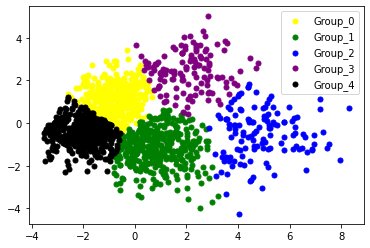

In [189]:
plt.scatter(X_principal.iloc[y_means==0,0],X_principal.iloc[y_means==0,1],s=25,c='yellow',label="Group_0")
plt.scatter(X_principal.iloc[y_means==1,0],X_principal.iloc[y_means==1,1],s=25,c='green',label="Group_1")
plt.scatter(X_principal.iloc[y_means==2,0],X_principal.iloc[y_means==2,1],s=25,c='blue',label="Group_2")
plt.scatter(X_principal.iloc[y_means==3,0],X_principal.iloc[y_means==3,1],s=25,c='purple',label="Group_3")
plt.scatter(X_principal.iloc[y_means==4,0],X_principal.iloc[y_means==4,1],s=25,c='black',label="Group_4")
plt.legend()
plt.show()

In [190]:
silhouette_score(X_principal,y_means)

0.4255702350140425

## Heirarchical clustering

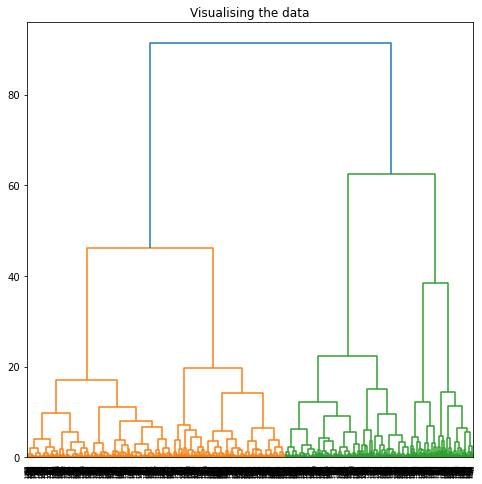

In [191]:
plt.figure(figsize =(8, 8))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(X_principal, method ='ward')))

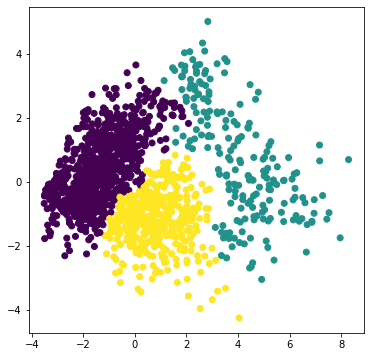

In [192]:
ac2 = AgglomerativeClustering(n_clusters = 3)
 
# Visualizing the clustering
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
           c = ac2.fit_predict(X_principal))
plt.show()

In [193]:
cluster = AgglomerativeClustering(n_clusters=2,affinity = 'euclidean', linkage = 'ward')

In [194]:
HC = cluster.fit_predict(X_principal)

In [195]:
HC

array([1, 0, 1, ..., 1, 0, 1], dtype=int64)

In [196]:
silhouette_score(X_principal,HC)

0.3999025735742288

## DBSCAN Clustering

In [197]:
from sklearn.cluster import DBSCAN

In [198]:
DBC = DBSCAN(eps=0.8,min_samples=15)
Label = DBC.fit_predict(X_principal)

In [199]:
np.unique(Label)

array([-1,  0], dtype=int64)

In [200]:
silhouette_score(X_principal,Label)

0.4745192062196644

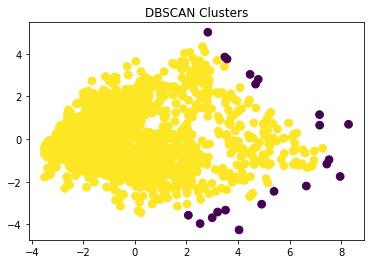

In [201]:
plt.scatter(X_principal['P1'],X_principal['P2'],c= Label,s=60)
plt.title('DBSCAN Clusters')
plt.show()